# VISTAB

Visualize or tabulate results.

In [2]:
from py_env_hpc import *

# Define the setup:
HPT_PATH = PSCRATCH_DIR + "HPT_v1/" # directory to look for HPT results
train_data_name = "train_data_hourly_pr_['HRES']_['HSAF']_MM_6__spatiotemporal_128.256_2020-07-01T13_2023-03-26T23_no_na.npz" # name of the training data used for training
produce_data_name = "produce_for_train_data_hourly_pr_['HRES']_['HSAF']_MM_6__spatiotemporal_128.256_2020-07-01T13_2023-04-26T23_no_na.npz" # name of the production file name used for production

## 1. Training/validation

In [2]:
# Load the processed data from the .npz file
stats_save_file = STATS + "/data_splits.npz"
loaded_data = np.load(stats_save_file)

# Extract the individual data arrays from the loaded file
train_y = loaded_data['mm_act_train_points']
val_y = loaded_data['mm_act_val_points']
test_y = loaded_data['mm_act_test_points']

train_x = loaded_data['hres_train_points']
val_x = loaded_data['hres_val_points']
test_x = loaded_data['hres_test_points']

train_pred_y = loaded_data['mm_pred_train_points']
val_pred_y = loaded_data['mm_pred_val_points']
test_pred_y = loaded_data['mm_pred_test_points']

train_x_c = loaded_data['hres_c_train_points']
val_x_c = loaded_data['hres_c_val_points']
test_x_c = loaded_data['hres_c_test_points']

### 1.1. HPT Combinations

#### 1.1.1 Top Parameters in Table

In [4]:
import pandas as pd
import glob

csv_files = glob.glob(HPT_PATH + "*.csv")

# Create lists to store the extracted hyperparameters, stop_epoch, and avg_loss
LR_list = []
BS_list = []
LRF_list = []
IFN_list = []
stop_epoch_list = []
avg_loss_list = []
val_loss_list = []
stop_loss_list = []

# Iterate over each CSV file
for file in csv_files:
    data = pd.read_csv(file)
    
    training_unique_name = file.replace(HPT_PATH, '').replace('.csv', '')
    hyperparameters = training_unique_name.split('_')
    
    LR = float(hyperparameters[2])
    BS = int(hyperparameters[6])
    LRF = float(hyperparameters[4])
    IFN = int(hyperparameters[1])
    
    val_loss = data['val_mse']
    min_val_loss = val_loss.min()
    min_val_loss_index = val_loss.idxmin()
    loss = data['mse']
    stop_loss = loss[min_val_loss_index]
    # Calculate the average of min_val_loss and stop_loss
    avg_loss = (min_val_loss * 0.1 + stop_loss * 0.9)
    
    # Extract the stop epoch as index of the minimum val_loss + 1
    stop_epoch = min_val_loss_index+1
    
    # Append the extracted hyperparameters, stop_epoch, and avg_loss to the lists
    LR_list.append(LR)
    BS_list.append(BS)
    IFN_list.append(IFN)
    stop_epoch_list.append(stop_epoch)
    avg_loss_list.append(avg_loss)
    val_loss_list.append(min_val_loss)
    stop_loss_list.append(stop_loss)

# Create a DataFrame with the extracted data
data_df = pd.DataFrame({
    'LR': LR_list,
    'BS': BS_list,
    'IFN': IFN_list,
    'val_loss': val_loss_list,
    'stop_loss': stop_loss_list,
    'avg_loss': avg_loss_list,
    'stop_epoch': stop_epoch_list  # Add the stop_epoch column as the index + 1
})

top_36_data_df = data_df.nsmallest(36, 'val_loss')
top_36_data_df = top_36_data_df.rename(columns={'stop_loss': 'train_loss'})
top_36_data_df = top_36_data_df.reset_index(drop=True)
file_path = DUMP_PLOT + "/top_36_data_df.xlsx"
top_36_data_df['rank'] = range(1, 37)
# Reorder the DataFrame columns
columns = ['rank', 'LR', 'BS', 'IFN', 'val_loss', 'train_loss', 'avg_loss', 'stop_epoch']
top_36_data_df = top_36_data_df[columns]

# Save DataFrame to an Excel file
top_36_data_df.to_excel(file_path, index=False)

best_index = val_loss_list.index(min(val_loss_list))
best_csv_file = csv_files[best_index]
best_csv_filename = os.path.basename(best_csv_file[:-4])
#print("BEST training_unique_name:", best_csv_filename)
training_unique_name = best_csv_filename
best_epoch=top_36_data_df["stop_epoch"][0]

top_36_data_df

,rank,LR,BS,IFN,val_loss,train_loss,avg_loss,stop_epoch
0,1,0.00100,16,64,0.187876,0.190625,0.190350,13
1,2,0.00100,16,32,0.187937,0.177924,0.178925,15
2,3,0.00010,16,64,0.188381,0.171694,0.173363,13
3,4,0.00010,4,64,0.189184,0.181731,0.182476,14
4,5,0.00100,8,64,0.189458,0.202730,0.201403,10
5,6,0.00100,8,32,0.189510,0.184696,0.185177,16
6,7,0.00100,8,16,0.189676,0.208845,0.206928,7
7,8,0.00010,8,64,0.189682,0.203127,0.201782,6
8,9,0.00100,4,64,0.191402,0.195139,0.194765,13
9,10,0.00010,2,32,0.191737,0.192302,0.192246,10


#### 1.1.2  Best Hyperparameter Setting Performance:

/tmp/ipykernel_3916/3019871344.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


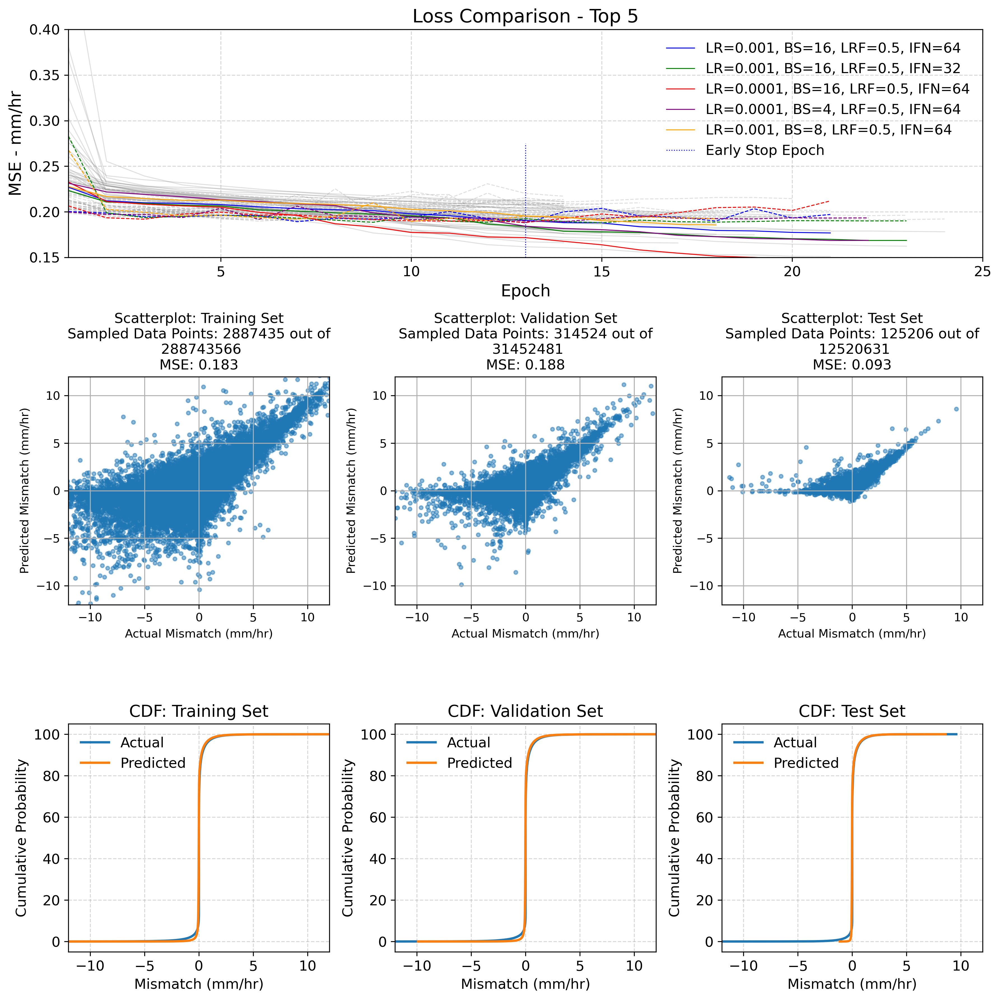

In [56]:
# to be adjusted:
sample_percentage = 0.01
fig = plt.figure(figsize=(12, 12), dpi=300, facecolor="white")

# Calculate the Mean Squared Error (MSE) for all data points
train_mse = mean_squared_error(train_y, train_pred_y)
val_mse = mean_squared_error(val_y, val_pred_y)
test_mse = mean_squared_error(test_y, test_pred_y)

# Round the MSE values to three digits
train_mse = round(train_mse, 3)
val_mse = round(val_mse, 3)
test_mse = round(test_mse, 3)

# Calculate the sample size as a percentage of the total points in each set
train_sample_size = int(len(train_y) * sample_percentage)
val_sample_size = int(len(val_y) * sample_percentage)
test_sample_size = int(len(test_y) * sample_percentage)

# Sample a subset of data points for plotting
train_sample_indices = np.random.choice(len(train_y), size=train_sample_size, replace=False)
val_sample_indices = np.random.choice(len(val_y), size=val_sample_size, replace=False)
test_sample_indices = np.random.choice(len(test_y), size=test_sample_size, replace=False)

train_sample_y = train_y[train_sample_indices]
train_sample_pred_y = train_pred_y[train_sample_indices]
val_sample_y = val_y[val_sample_indices]
val_sample_pred_y = val_pred_y[val_sample_indices]
test_sample_y = test_y[test_sample_indices]
test_sample_pred_y = test_pred_y[test_sample_indices]


# Calculate the CDF for each set of data points
train_sample_y_sorted = np.sort(train_sample_y)
train_sample_pred_y_sorted = np.sort(train_sample_pred_y)
train_y_cdf = np.arange(1, train_sample_size + 1) / train_sample_size * 100
train_pred_y_cdf = np.arange(1, train_sample_size + 1) / train_sample_size * 100
val_sample_y_sorted = np.sort(val_sample_y)
val_sample_pred_y_sorted = np.sort(val_sample_pred_y)
val_y_cdf = np.arange(1, val_sample_size + 1) / val_sample_size * 100
val_pred_y_cdf = np.arange(1, val_sample_size + 1) / val_sample_size * 100
test_sample_y_sorted = np.sort(test_sample_y)
test_sample_pred_y_sorted = np.sort(test_sample_pred_y)
test_y_cdf = np.arange(1, test_sample_size + 1) / test_sample_size * 100
test_pred_y_cdf = np.arange(1, test_sample_size + 1) / test_sample_size * 100

# Set up the grid layout
axes1 = plt.subplot2grid((3, 3), (0, 0), colspan=3)  # This will span 3 columns
axes2 = plt.subplot2grid((3, 3), (1, 0))  # Scatterplot for training set
axes3 = plt.subplot2grid((3, 3), (1, 1))  # Scatterplot for validation set
axes4 = plt.subplot2grid((3, 3), (1, 2))  # Scatterplot for test set
axes5 = plt.subplot2grid((3, 3), (2, 0))  # CDF for training set
axes6 = plt.subplot2grid((3, 3), (2, 1))  # CDF for validation set
axes7 = plt.subplot2grid((3, 3), (2, 2))  # CDF for test set

# Plot for the top 5 data comparison
# Define the colors for the lines
colors = ['blue', 'green', 'red', 'purple', 'orange']
line_colors = itertools.cycle(colors)

# Iterate over all 36 rows of the DataFrame
for index, row in top_36_data_df.iterrows():
    # Extract LR, BS, LRF, and IFN values
    LR = row['LR']
    BS = int(row['BS'])
    IFN = int(row['IFN'])

    # Generate the training_unique_name
    loss = "mse"
    min_LR = 0.00000000000001
    lr_patience = 2
    patience = 8
    epochs = 64
    val_split = 0.1
    training_unique_name = f"{loss}_{IFN}_{LR}_{min_LR}_{LRF}_{lr_patience}_{int(BS)}_{patience}_{val_split}_{epochs}"

    file_path = HPT_PATH + training_unique_name + ".csv"
    data = pd.read_csv(file_path)

    if index > 4:
        axes1.plot(data['mse'].index + 1, data['mse'], label='', linewidth=0.8, color='gray', alpha=0.25, zorder=1)
        axes1.plot(data['val_mse'].index + 1, data['val_mse'], label='', linestyle='dashed', linewidth=0.8, color='gray', zorder=1, alpha=0.25)
    else:
        line_color = next(line_colors)
        axes1.plot(data['mse'].index + 1, data['mse'], label=f'LR={LR}, BS={BS}, LRF={LRF}, IFN={IFN}', linewidth=0.8, color=line_color)
        axes1.plot(data['val_mse'].index + 1, data['val_mse'], label='', linestyle='dashed', linewidth=0.8, color=line_color)
        
def plot_scatterplot(ax, sample_y, sample_pred_y, title, sample_size, total_size, mse):
    ax.scatter(sample_y, sample_pred_y, s=10, alpha=0.5)
    ax.set_xlabel("Actual Mismatch (mm/hr)")
    ax.set_ylabel("Predicted Mismatch (mm/hr)")
    ax.set_title(f"{title}\nSampled Data Points: {sample_size} out of\n {total_size}\nMSE: {mse:.3f}")
    ax.set_xlim(-12, 12)
    ax.set_ylim(-12, 12)
    ax.grid(True)
    
axes1.axvline(x=best_epoch, ymax=0.5, color='blue', linestyle='dotted', linewidth=0.8, label='Early Stop Epoch')
axes1.set_title('Loss Comparison - Top 5', fontsize=16)
axes1.set_xlabel('Epoch', fontsize=14)
axes1.set_ylabel('MSE - mm/hr', fontsize=14)
axes1.tick_params(axis='x', labelsize=12)
axes1.tick_params(axis='y', labelsize=12)
axes1.legend(fontsize=12, frameon=False)
axes1.grid(True, linestyle='--', alpha=0.5)
axes1.set_ylim(0.15, 0.40)
axes1.set_xlim(1, 25)

# Update plot_scatterplot calls with total_size argument
plot_scatterplot(axes2, train_sample_y, train_sample_pred_y, "Scatterplot: Training Set", train_sample_size, len(train_y), train_mse)
plot_scatterplot(axes3, val_sample_y, val_sample_pred_y, "Scatterplot: Validation Set", val_sample_size, len(val_y), val_mse)
plot_scatterplot(axes4, test_sample_y, test_sample_pred_y, "Scatterplot: Test Set", test_sample_size, len(test_y), test_mse)

def plot_cdf(ax, data, label):
    sorted_data = np.sort(data)
    cdf = np.arange(1, len(data) + 1) / len(data) * 100
    ax.plot(sorted_data, cdf, label=label, linewidth=2)
    ax.set_xlabel('Mismatch (mm/hr)', fontsize=12)
    ax.set_ylabel('Cumulative Probability', fontsize=12)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.legend(fontsize=12, frameon=False)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xlim(-12, 12)  # Set the x-axis limits to -12 and 12
    
# CDF for training set
plot_cdf(axes5, train_sample_y, 'Actual')
plot_cdf(axes5, train_sample_pred_y, 'Predicted')
axes5.set_title('CDF: Training Set', fontsize=14)

# CDF for validation set
plot_cdf(axes6, val_sample_y, 'Actual')
plot_cdf(axes6, val_sample_pred_y, 'Predicted')
axes6.set_title('CDF: Validation Set', fontsize=14)

# CDF for test set
plot_cdf(axes7, test_sample_y, 'Actual')
plot_cdf(axes7, test_sample_pred_y, 'Predicted')
axes7.set_title('CDF: Test Set', fontsize=14)

# Adjust the layout and save the plot
plt.tight_layout()
plt.savefig(DUMP_PLOT + '/HPT_Training_Results.png', dpi=300)
plt.show()

#### 1.1.3 The top five in tables:


In [5]:
import itertools

# Iterate over the top 5 rows of the DataFrame
for index, row in top_36_data_df[:1].iterrows():
    # Extract LR, BS, LRF, and IFN values
    LR = row['LR']
    BS = int(row['BS'])
    IFN = int(row['IFN'])

    # Generate the training_unique_name
    loss = "mse"
    min_LR = 0.00000000000001
    lr_patience = 2
    patience = 8
    epochs = 64
    val_split = 0.1
    training_unique_name = f"{loss}_{IFN}_{LR}_{min_LR}_{LRF}_{lr_patience}_{int(BS)}_{patience}_{val_split}_{epochs}"

    # Construct the file path
    file_path = HPT_PATH + training_unique_name + ".csv"

    # Read the data from the CSV file
    data = pd.read_csv(file_path)
    print(data[["mse", "val_mse", "lr"]])
    
    print(training_unique_name)

         mse   val_mse        lr
0   0.226908  0.200343  0.001000
1   0.212068  0.198693  0.001000
2   0.209936  0.194568  0.001000
3   0.209207  0.194623  0.001000
4   0.207927  0.196116  0.001000
5   0.205502  0.195888  0.000500
6   0.203488  0.189187  0.000500
7   0.202281  0.192929  0.000500
8   0.201381  0.191889  0.000500
9   0.197804  0.194207  0.000250
10  0.195705  0.200344  0.000250
11  0.192107  0.192565  0.000125
12  0.190625  0.187876  0.000125
13  0.188155  0.199970  0.000125
14  0.187844  0.203744  0.000125
15  0.183622  0.195425  0.000063
16  0.182412  0.194143  0.000063
17  0.179574  0.189897  0.000031
18  0.179031  0.203352  0.000031
19  0.177415  0.193208  0.000016
20  0.176819  0.197100  0.000016
mse_64_0.001_1e-14_0.5_2_16_8_0.1_64


### 1.2. Training/Validation/Testing CDF-Scatterplots

#### 1.2.1 CDFs - Seasonal

/p/project/deepacf/kiste/patakchiyousefi1/SC_VENV/envs/prc_env/lib/python3.8/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


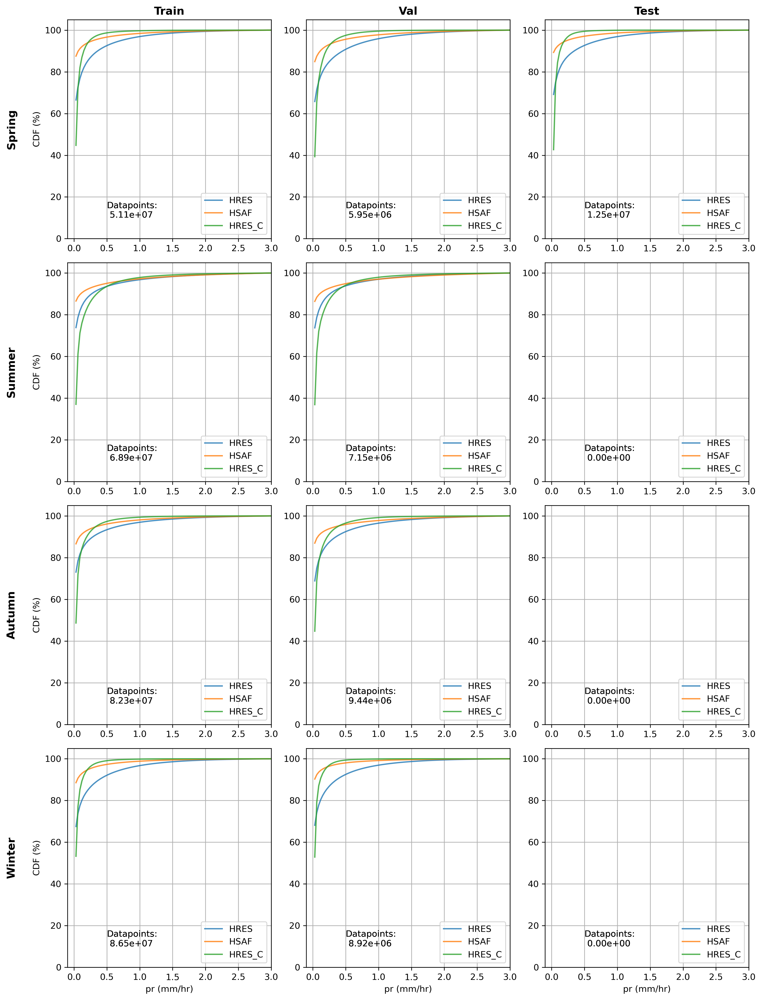

In [3]:
# Define parameters
sampling_ratio = 1
num_bins = 100
range_min_plot = -0.1
range_max_plot = 3
range_min = 0
range_max = 3
text_fontsize = 10
figure_size = (12, 16)
seed_value = int(sampling_ratio*100)

# Load the data from the npz file
data = np.load(STATS + "/data_splits_seasonal.npz", allow_pickle=True)

# Function to sample data
def sample_data(data, sampling_ratio, seed_value):
    np.random.seed(seed_value)
    num_samples = int(len(data) * sampling_ratio)
    return np.random.choice(data, num_samples, replace=False)

# Function to plot CDF
def plot_cdf(data, label, subplot):
    counts, bin_edges = np.histogram(data, bins=num_bins, range=(range_min, range_max), density=True)
    cdf = np.cumsum(counts) / sum(counts)
    subplot.plot(bin_edges[1:], cdf * 100, label=label, alpha=0.8)

# Create subplot grid
fig, axs = plt.subplots(4, 3, figsize=figure_size, dpi=300)  # 4 rows, 3 columns
seasons = ['spring', 'summer', 'autumn', 'winter']
datasets = ['train', 'val', 'test']  # Datasets for each column

for i, season in enumerate(seasons):
    for j, dataset in enumerate(datasets):
        # Sample and plot for each season and dataset
        for model in ['hres', 'hsaf', 'hres_c']:
            points = data[f'{model}_{dataset}_{season}_points']
            if sampling_ratio != 1:
                sampled_points = sample_data(points, sampling_ratio, seed_value)
                plot_cdf(sampled_points, model.upper(), axs[i][j])
            else:
                sampled_points = points
                plot_cdf(sampled_points, model.upper(), axs[i][j])
                
            # Count the number of sampled data points
            num_sampled = len(sampled_points)
            num_sampled_scientific = "{:.2e}".format(num_sampled)
            if sampling_ratio != 1:
                axs[i][j].text(0.5, 10, f"Sampled Datapoints:\n {num_sampled_scientific}/{len(points)}", fontsize=text_fontsize)
            else:
                axs[i][j].text(0.5, 10, f"Datapoints:\n {num_sampled_scientific}", fontsize=text_fontsize)
        # Set plot attributes and add legend with count information
        if season == "winter":
            axs[i][j].set_xlabel("pr (mm/hr)")
        if dataset=='train':
            axs[i][j].set_ylabel("CDF (%)", fontsize=text_fontsize)  # First label
            axs[i][j].text(-0.3, 0.5,f"{season.capitalize()}\n\n", weight = "bold", fontsize=text_fontsize*1.25, transform = axs[i][j].transAxes, verticalalignment='center', rotation=90) 
        if season == "spring":
            axs[i][j].set_title(f"{dataset.capitalize()}", weight = "bold", fontsize=text_fontsize*1.25)
        axs[i][j].legend(loc='lower right')  # Place the legend in the bottom right corner
        axs[i][j].grid(True)
        axs[i][j].set_xlim(range_min_plot, range_max_plot)
        axs[i][j].set_ylim(0, 105)  # Set the y-axis limit to 0-100

# Adjust the layout for better spacing
plt.savefig(DUMP_PLOT + "/CDF_seasonal.png", facecolor='w')  # 'w' is short for 'white'
fig.tight_layout()
plt.show()

#### 1.2.2 CDFs - Overall

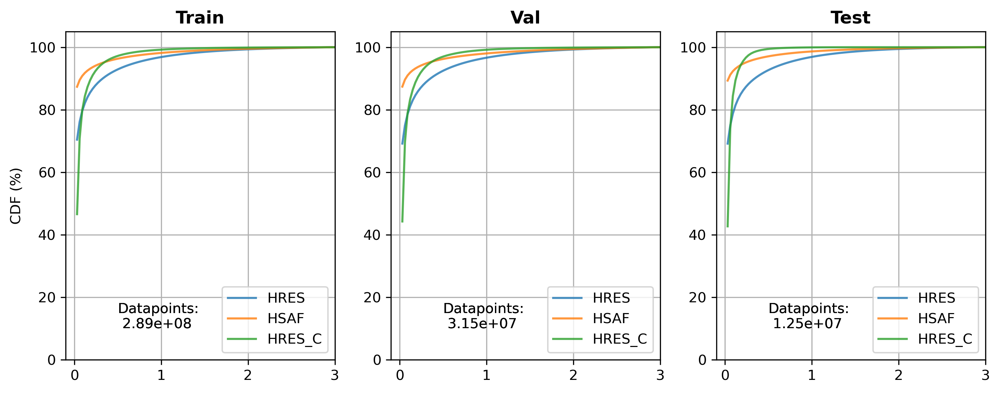

In [16]:
# Define parameters
sampling_ratio = 1
num_bins = 100
range_min_plot = -0.1
range_max_plot = 3
range_min = 0
range_max = 3
text_fontsize = 10
figure_size = (10, 4)
seed_value = int(sampling_ratio*100)

# Load the data from the npz file
data = np.load(STATS + "/data_splits.npz", allow_pickle=True)

# Function to sample data
def sample_data(data, sampling_ratio, seed_value):
    np.random.seed(seed_value)
    num_samples = int(len(data) * sampling_ratio)
    return np.random.choice(data, num_samples, replace=False)

# Function to plot CDF
def plot_cdf(data, label, subplot):
    counts, bin_edges = np.histogram(data, bins=num_bins, range=(range_min, range_max), density=True)
    cdf = np.cumsum(counts) / sum(counts)
    subplot.plot(bin_edges[1:], cdf * 100, label=label, alpha=0.8)

# Create subplot grid
fig, axs = plt.subplots(1, 3, figsize=figure_size, dpi=300)  # 4 rows, 3 columns
datasets = ['train', 'val', 'test']  # Datasets for each column
for j, dataset in enumerate(datasets):
    for model in ['hres', 'hsaf', 'hres_c']:
        points = data[f'{model}_{dataset}_points']
        if sampling_ratio != 1:
            sampled_points = sample_data(points, sampling_ratio, seed_value)
            plot_cdf(sampled_points, model.upper(), axs[j])
        else:
            sampled_points = points
            plot_cdf(sampled_points, model.upper(), axs[j])

        # Count the number of sampled data points
        num_sampled = len(sampled_points)
        num_sampled_scientific = "{:.2e}".format(num_sampled)
        if sampling_ratio != 1:
            axs[j].text(0.5, 10, f"Sampled Datapoints:\n {num_sampled_scientific}/{len(points)}", fontsize=text_fontsize)
        else:
            axs[j].text(0.5, 10, f"Datapoints:\n {num_sampled_scientific}", fontsize=text_fontsize)
    # Set plot attributes and add legend with count information
    axs[j].set_ylabel("CDF (%)", fontsize=text_fontsize)  # First label
    axs[j].set_title(f"{dataset.capitalize()}", weight = "bold", fontsize=text_fontsize*1.25)
    axs[j].legend(loc='lower right')  # Place the legend in the bottom right corner
    axs[j].grid(True)
    axs[j].set_xlim(range_min_plot, range_max_plot)
    axs[j].set_ylim(0, 105)  # Set the y-axis limit to 0-100

# Adjust the layout for better spacing
plt.savefig(DUMP_PLOT + "/CDF_overall.png", facecolor='w')  # 'w' is short for 'white'
fig.tight_layout()
plt.show()

In [30]:
import numpy as np

# Define parameters
sampling_ratio = 1
seed_value = int(sampling_ratio * 100)

# Load the data from the npz file
data = np.load(STATS + "/data_splits.npz", allow_pickle=True)

# Function to sample data
def sample_data(data, sampling_ratio, seed_value):
    np.random.seed(seed_value)
    num_samples = int(len(data) * sampling_ratio)
    return np.random.choice(data, num_samples, replace=False)

# Function to calculate the probability of precipitation in a specified range
def calculate_probability(data, range_min, range_max):
    return np.mean((data >= range_min) & (data < range_max))

# Precipitation ranges
ranges = [(0, 0.1), (0.1, 2.5), (2.5, 10), (10, np.inf)]

# Create tables for each range
for i, (range_min, range_max) in enumerate(ranges):
    probabilities = []

    datasets = ['train', 'val', 'test']  # Datasets
    for dataset in datasets:
        prob_row = []  # Store probabilities for this dataset
        for model in ['hres', 'hsaf', 'hres_c']:
            points = data[f'{model}_{dataset}_points']
            if sampling_ratio != 1:
                sampled_points = sample_data(points, sampling_ratio, seed_value)
            else:
                sampled_points = points

            # Calculate the probability of precipitation in the specified range
            prob = calculate_probability(sampled_points, range_min, range_max)
            prob_row.append(prob)
        probabilities.append(prob_row)

    # Generate the probability table for the current range
    header = ["Model", "Training", "Validation", "Test"]
    table_data = [["hres", *probabilities[0]],
                  ["hsaf", *probabilities[1]],
                  ["hres_c", *probabilities[2]]]

    # Define precipitation range labels
    if range_max == 0.1:
        range_label = "0 <= pr < 0.1 (No Rain)"
    elif range_max == 2.5:
        range_label = "0.1 <= pr < 2.5 (Drizzle/Light Rain)"
    elif range_max == 10:
        range_label = "2.5 <= pr < 10 (Moderate Rain)"
    else:
        range_label = "pr >= 10 (Heavy/Violent Rain)"

    # Print the probability table for the current range with three decimal places
    print(f"Table {i + 1}: {range_label}")
    print("{:<10} {:<15} {:<15} {:<15}".format(*header))
    for row in table_data:
        print("{:<10} {:<15.3%} {:<15.3%} {:<15.3%}".format(row[0], row[1], row[2], row[3]))
    print("\n")


Table 1: 0 <= pr < 0.1 (No Rain)
Model      Training        Validation      Test           
hres       80.176%         90.696%         81.587%        
hsaf       79.120%         90.785%         80.531%        
hres_c     79.523%         92.418%         86.389%        


Table 2: 0.1 <= pr < 2.5 (Drizzle/Light Rain)
Model      Training        Validation      Test           
hres       19.125%         8.592%          18.305%        
hsaf       20.147%         8.419%          19.355%        
hres_c     20.063%         7.246%          13.611%        


Table 3: 2.5 <= pr < 10 (Moderate Rain)
Model      Training        Validation      Test           
hres       0.691%          0.687%          0.107%         
hsaf       0.725%          0.779%          0.114%         
hres_c     0.414%          0.327%          0.000%         


Table 4: pr >= 10 (Heavy/Violent Rain)
Model      Training        Validation      Test           
hres       0.008%          0.025%          0.001%         
hsaf      

#### 1.2.3 Scatterplots

/tmp/ipykernel_22560/2171746080.py:43: RuntimeWarning: Mean of empty slice.
  mse_hres = np.round(((sampled_hsaf_points - sampled_hres_points) ** 2).mean(), 3)
/tmp/ipykernel_22560/2171746080.py:44: RuntimeWarning: Mean of empty slice.
  mse_hres_c = np.round(((sampled_hsaf_points - sampled_hres_c_points) ** 2).mean(), 3)


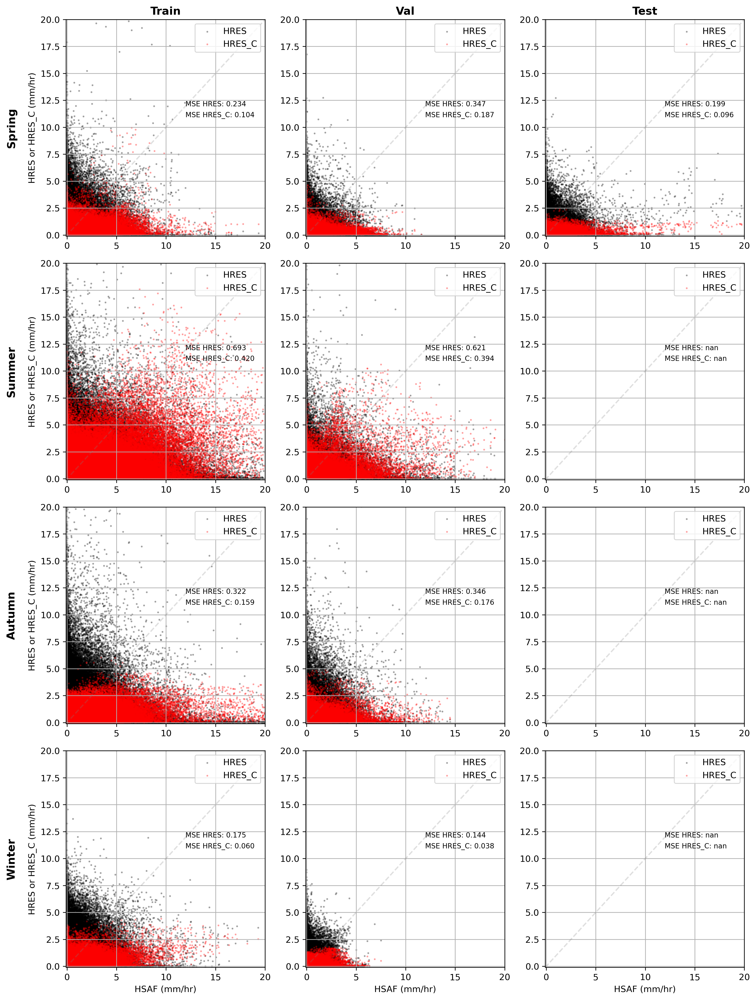

In [46]:
# Define parameters
sampling_ratio = 0.1
range_min_plot = -0.1
range_max_plot = 20
text_fontsize = 10
figure_size = (12, 16)
ms=1.5
seed_value = int(sampling_ratio*100)

# Load the data from the npz file
data = np.load(STATS + "/data_splits_seasonal.npz", allow_pickle=True)

# Function to sample data
def sample_ind(data, sampling_ratio, seed_value):
    np.random.seed(seed_value)
    num_samples = int(len(data) * sampling_ratio)
    indices = np.arange(len(data))
    sampled_indices = np.random.choice(indices, num_samples, replace=False)
    return sampled_indices.astype(int)

# Create subplot grid
fig, axs = plt.subplots(4, 3, figsize=figure_size, dpi=300)  # 4 rows, 3 columns
seasons = ['spring', 'summer', 'autumn', 'winter']
datasets = ['train', 'val', 'test']  # Datasets for each column

for i, season in enumerate(seasons):
    for j, dataset in enumerate(datasets):
        # Sample and scatter plot for each season and dataset
        hsaf_points = data[f'hsaf_{dataset}_{season}_points']
        hres_points = data[f'hres_{dataset}_{season}_points']
        hres_c_points = data[f'hres_c_{dataset}_{season}_points']
        sampled_ind = sample_ind(hsaf_points, sampling_ratio, seed_value)

        if sampling_ratio != 1:
            sampled_hsaf_points = hsaf_points[sampled_ind]
            sampled_hres_points = hres_points[sampled_ind]
            sampled_hres_c_points = hres_c_points[sampled_ind]
        else:
            sampled_hsaf_points = hsaf_points
            sampled_hres_points = hres_points
            sampled_hres_c_points = hres_c_points

        mse_hres = np.round(((sampled_hsaf_points - sampled_hres_points) ** 2).mean(), 3)
        mse_hres_c = np.round(((sampled_hsaf_points - sampled_hres_c_points) ** 2).mean(), 3)
                
        axs[i][j].plot([range_min_plot, range_max_plot], [range_min_plot, range_max_plot], color='gray', linestyle='--', alpha=0.25)
        
        axs[i][j].scatter(sampled_hsaf_points, sampled_hres_points, label="HRES", alpha=0.25, s=ms, color="black")
        axs[i][j].scatter(sampled_hsaf_points, sampled_hres_c_points, label="HRES_C", alpha=0.25, s=ms, color="red")
    
        # Set plot attributes and add legend with count information
        if season == "winter":
            axs[i][j].set_xlabel("HSAF (mm/hr)")
        if dataset=='train':
            axs[i][j].set_ylabel("HRES or HRES_C (mm/hr)", fontsize=text_fontsize)  # First label
            axs[i][j].text(-0.3, 0.5,f"{season.capitalize()}\n\n", weight = "bold", fontsize=text_fontsize*1.25, transform = axs[i][j].transAxes, verticalalignment='center', rotation=90) 
        if season == "spring":
            axs[i][j].set_title(f"{dataset.capitalize()}", weight = "bold", fontsize=text_fontsize*1.25)
        axs[i][j].legend(loc='upper right')  # Place the legend in the upper right corner
        axs[i][j].grid(True)
        axs[i][j].set_xlim(range_min_plot, range_max_plot)
        axs[i][j].set_ylim(range_min_plot, range_max_plot)
        
        axs[i][j].text(0.6, 0.55, f"MSE HRES_C: {mse_hres_c:.3f}", transform=axs[i][j].transAxes, fontsize=8, color='black')
        axs[i][j].text(0.6, 0.6, f"MSE HRES: {mse_hres:.3f}", transform=axs[i][j].transAxes, fontsize=8, color='black')


# Adjust the layout for better spacing
plt.savefig(DUMP_PLOT + "/scatter_seasonal.png", facecolor='w')  # 'w' is short for 'white'
fig.tight_layout()
plt.show()

## 2. Error Maps

### 2.1. ME, RMSE, COR

#### 2.0.1 Plot prerequisites

In [36]:
# Define the error metrics, temporal resolutions, and seasons
from matplotlib.colors import LinearSegmentedColormap

error_metrics = ["ME", "RMSE", "COR"]
temporal_resolutions = ["hourly", "daily", "monthly"]
seasons = ["DJF", "MAM", "JJA", "SON"]
variable = "pr"

# Define the plot ranges, units, and colormaps for each error metric and temporal resolution
plot_ranges = {
    ("ME", "hourly"): (-0.4, 0.4),
    ("ME", "daily"): (-4, 4),
    ("ME", "monthly"): (-100, 100),
    ("RMSE", "hourly"): (0, 2),
    ("RMSE", "daily"): (0, 10),
    ("RMSE", "monthly"): (0, 100),
    ("COR", "hourly"): (0, 0.8),
    ("COR", "daily"): (0, 0.8),
    ("COR", "monthly"): (0, 0.8),
}

units = {
    ("ME", "hourly"): "mm/hr",
    ("ME", "daily"): "mm/day",
    ("ME", "monthly"): "mm/month",
    ("RMSE", "hourly"): "mm/hr",
    ("RMSE", "daily"): "mm/day",
    ("RMSE", "monthly"): "mm/month",
    ("COR", "hourly"): "Hourly",
    ("COR", "daily"): "Daily",
    ("COR", "monthly"): "Monthly",
}

colormaps = {
    ("ME", "hourly"): plt.get_cmap("coolwarm", 8),
    ("ME", "daily"): plt.get_cmap("coolwarm", 8),
    ("ME", "monthly"): plt.get_cmap("coolwarm", 10),
    ("RMSE", "hourly"): plt.get_cmap("rainbow", 8),
    ("RMSE", "daily"): plt.get_cmap("rainbow", 10),
    ("RMSE", "monthly"): plt.get_cmap("rainbow", 10),
    ("COR", "hourly"): plt.get_cmap("rainbow", 8),
    ("COR", "daily"): plt.get_cmap("rainbow", 8),
    ("COR", "monthly"): plt.get_cmap("rainbow", 8),
}


# Define the plot ranges, units, and colormaps for each error metric and temporal resolution for improvement plots

plot_ranges_i = {
    ("ME", "hourly"): (-200, 200),
    ("ME", "daily"): (-200, 200),
    ("ME", "monthly"): (-200, 200),
    ("RMSE", "hourly"): (-50, 50),
    ("RMSE", "daily"): (-50, 50),
    ("RMSE", "monthly"): (-50, 50),
    ("COR", "hourly"): (-50, 50),
    ("COR", "daily"): (-50, 50),
    ("COR", "monthly"): (-50, 50),
}

units_i = {
    ("ME", "hourly"): "Improvement (%)",
    ("ME", "daily"): "Improvement (%)",
    ("ME", "monthly"): "Improvement (%)",
    ("RMSE", "hourly"): "Improvement (%)",
    ("RMSE", "daily"): "Improvement (%)",
    ("RMSE", "monthly"): "Improvement (%)",
    ("COR", "hourly"): "Improvement (%)",
    ("COR", "daily"): "Improvement (%)",
    ("COR", "monthly"): "Improvement (%)",
}


cmap_cor=LinearSegmentedColormap.from_list('rg',["r", "w", "g"], N=10) 

#### 2.1.1 HRES Seasons and Scales

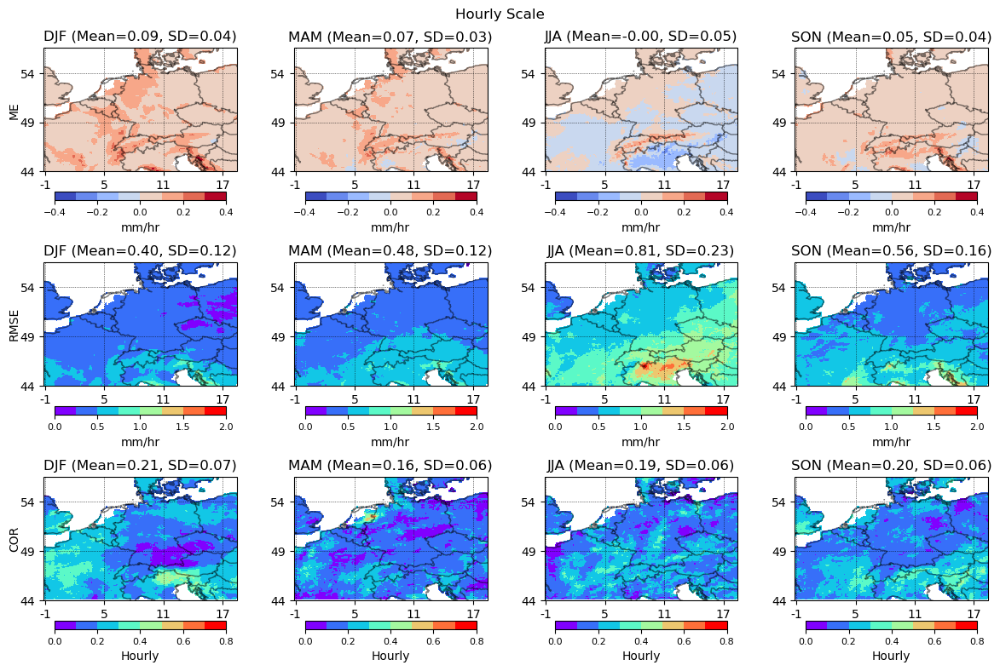

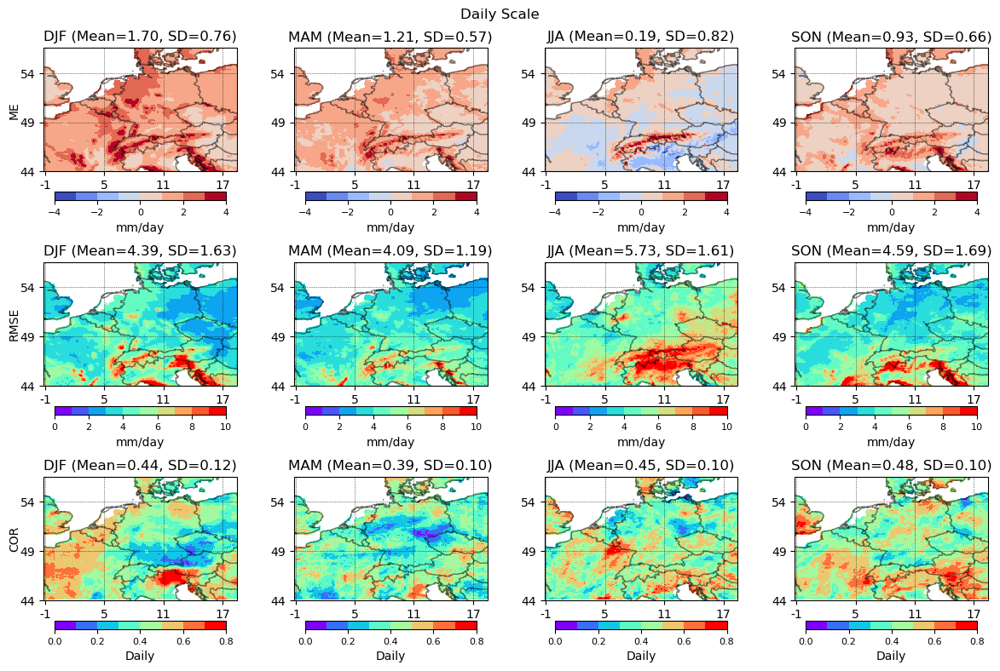

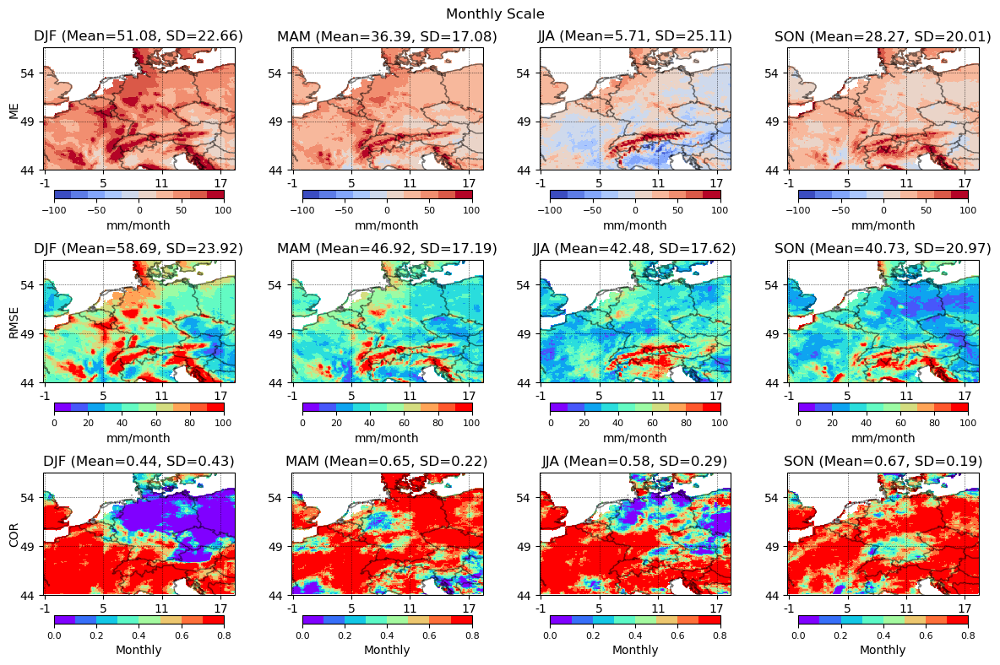

In [46]:
# mask for land
altitude_data = np.load("/p/project/deepacf/kiste/patakchiyousefi1/IO/03-TOPOGRAPHY/HSAF-TOPO.npz")
altitude = altitude_data["arr_0"][..., 2]
land=(altitude>0.1).astype(np.float32)
land[land != 1] = np.nan

# Iterate through the temporal resolutions
for temporal_resolution in temporal_resolutions:
    # Create a subplot grid for each temporal resolution
    fig, axs = plt.subplots(len(error_metrics), len(seasons), figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

    for i, error_metric in enumerate(error_metrics):
        for j, season in enumerate(seasons):
            # Load the error file
            file_name = f"{STATS}/{season}_{temporal_resolution}_{error_metric}.nc"
            error_data = xr.open_dataset(file_name)

            # Get the error values and lat/lon coordinates
            error_values = error_data[variable].values*land
            latitudes = error_data["latitude"].values
            longitudes = error_data["longitude"].values

            # Get the plot range, units, and colormap for the current error metric and temporal resolution
            plot_range = plot_ranges[(error_metric, temporal_resolution)]
            unit = units[(error_metric, temporal_resolution)]
            cmap = colormaps[(error_metric, temporal_resolution)]
            
            # Calculate the average and standard deviation
            avg = np.nanmean(error_values.flatten())
            std_dev = np.nanstd(error_values.flatten())

            # Create the plot in the corresponding subplot
            if j == 0:
                ax = axs[i, j]
                ax.text(-0.15, 0.5, error_metric, fontsize=10, va="center", ha="center", rotation="vertical", transform=ax.transAxes)
            else:
                ax = axs[i, j]
            ax.coastlines(resolution='auto' ,linestyle='-', alpha=0.5)  # Increase border line detail
            ax.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5)  # Increase country border line detail
            im = ax.pcolormesh(longitudes, latitudes, error_values, cmap=cmap, vmin=plot_range[0], vmax=plot_range[1], transform=ccrs.PlateCarree())
            ax.set_title(f"{season} (Mean={avg:.2f}, SD={std_dev:.2f})")
            
            # Remove the axis labels for Longitude and Latitude
            ax.set_xticklabels([])
            ax.set_yticklabels([])

            # Set xticks and yticks based on the min and max of latitude and longitude
            xticks = np.arange(int(longitudes.min()), int(longitudes.max()) + 1, 6)
            yticks = np.arange(int(latitudes.min()), int(latitudes.max()) + 1, 5)
            ax.set_xticks(xticks, crs=ccrs.PlateCarree())
            ax.set_yticks(yticks, crs=ccrs.PlateCarree())

            lon_formatter = mticker.FormatStrFormatter("%.0f")
            lat_formatter = mticker.FormatStrFormatter("%.0f")
            ax.xaxis.set_major_formatter(lon_formatter)
            ax.yaxis.set_major_formatter(lat_formatter)

            # Add narrow black gridlines
            ax.grid(linestyle=':', linewidth=0.5, color='black')

            cbar = fig.colorbar(im, ax=ax, label=unit, pad=0.12, shrink=0.8, location="bottom")  # Adjust colorbar size
            cbar.ax.tick_params(labelsize=8)  # Adjust colorbar tick label size

    # Add a main title for the plot
    fig.suptitle(f"{temporal_resolution.capitalize()} Scale")

    # Adjust the spacing between subplots
    fig.tight_layout()
    fig.set_facecolor('white')
    plt.savefig(f"{DUMP_PLOT}/{temporal_resolution}_seasons.png", dpi=200)  # Adjust the filename and DPI as desired

    # Display or save the plot
    plt.show()

#### 2.2.1 HRES_C Seasons and Scales

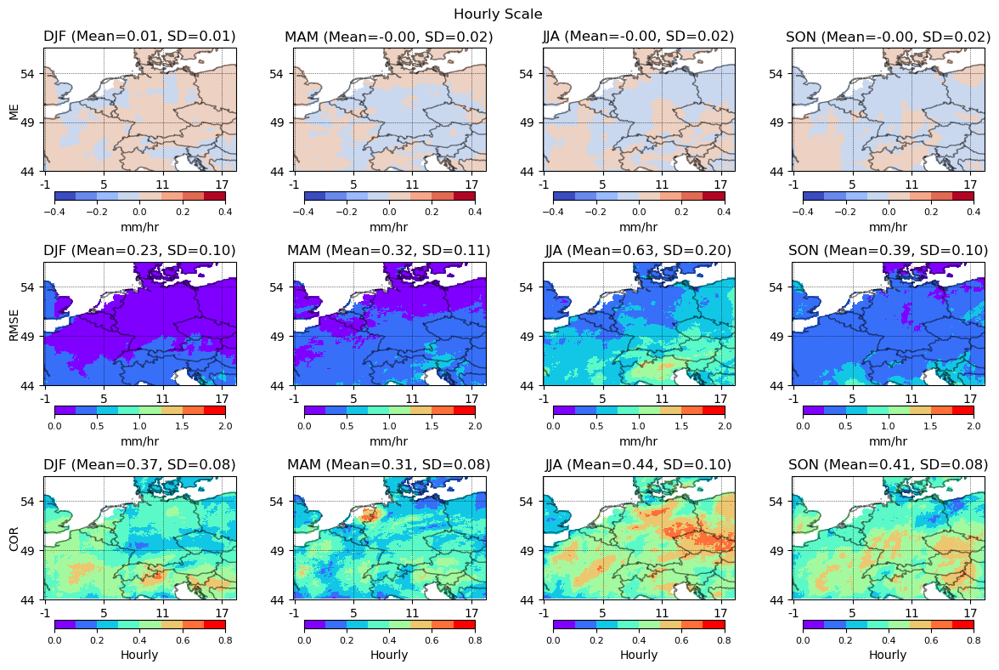

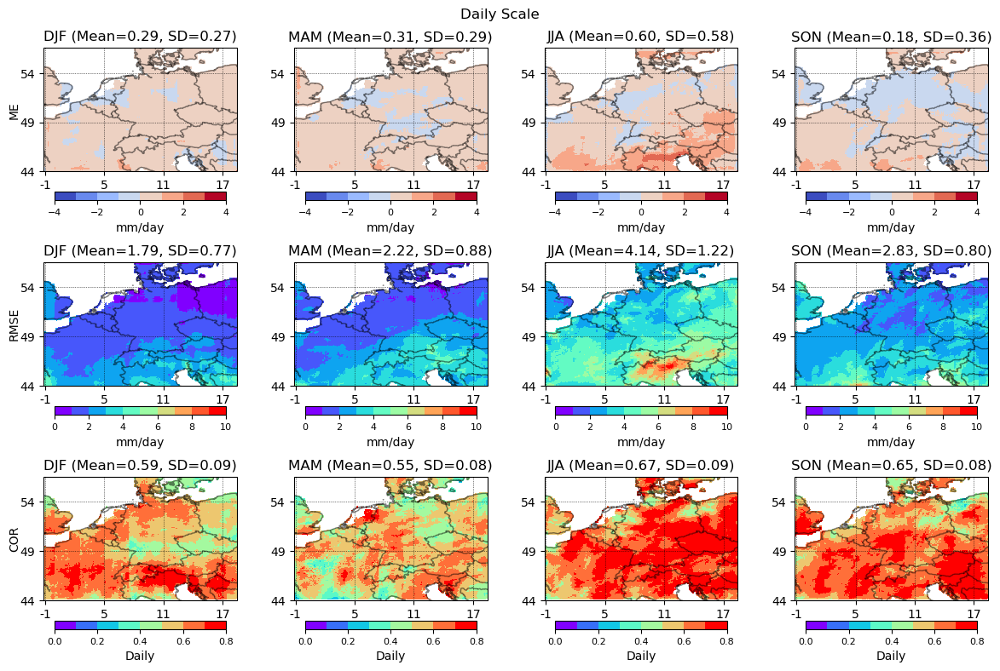

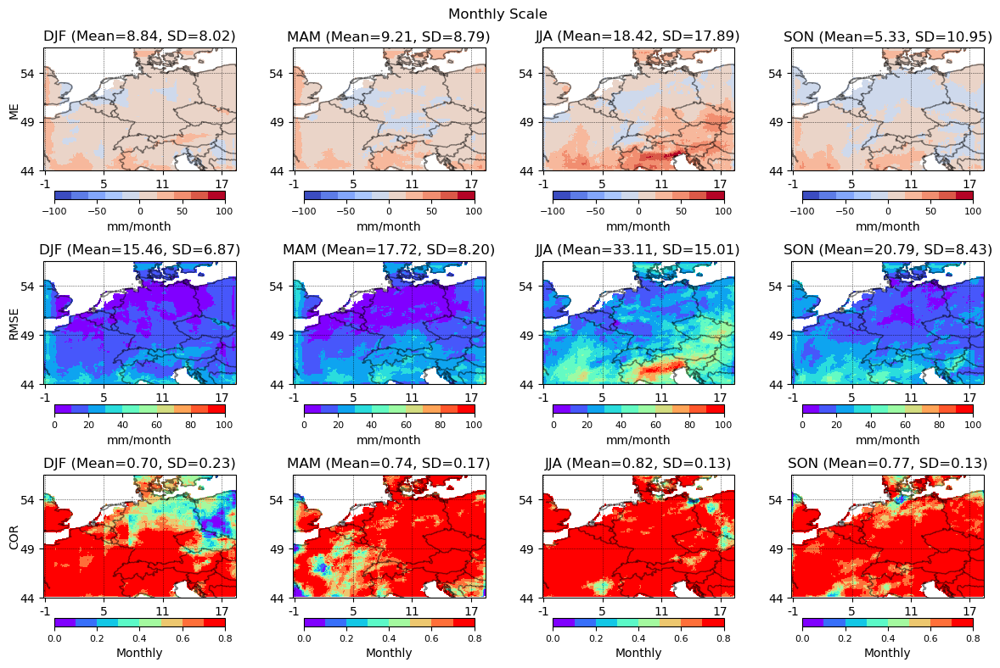

In [47]:
# mask for land
altitude_data = np.load("/p/project/deepacf/kiste/patakchiyousefi1/IO/03-TOPOGRAPHY/HSAF-TOPO.npz")
altitude = altitude_data["arr_0"][..., 2]
land=(altitude>0.1).astype(np.float32)
land[land != 1] = np.nan

# Iterate through the temporal resolutions
for temporal_resolution in temporal_resolutions:
    # Create a subplot grid for each temporal resolution
    fig, axs = plt.subplots(len(error_metrics), len(seasons), figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

    for i, error_metric in enumerate(error_metrics):
        for j, season in enumerate(seasons):
            # Load the error file
            file_name = f"{STATS}/{season}_{temporal_resolution}_{error_metric}_C.nc"
            error_data = xr.open_dataset(file_name)

            # Get the error values and lat/lon coordinates
            error_values = error_data[variable].values*land
            latitudes = error_data["latitude"].values
            longitudes = error_data["longitude"].values

            # Get the plot range, units, and colormap for the current error metric and temporal resolution
            plot_range = plot_ranges[(error_metric, temporal_resolution)]
            unit = units[(error_metric, temporal_resolution)]
            cmap = colormaps[(error_metric, temporal_resolution)]
            
            # Calculate the average and standard deviation
            avg = np.nanmean(error_values.flatten())
            std_dev = np.nanstd(error_values.flatten())

            # Create the plot in the corresponding subplot
            if j == 0:
                ax = axs[i, j]
                ax.text(-0.15, 0.5, error_metric, fontsize=10, va="center", ha="center", rotation="vertical", transform=ax.transAxes)
            else:
                ax = axs[i, j]
            ax.coastlines(resolution='auto' ,linestyle='-', alpha=0.5)  # Increase border line detail
            ax.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5)  # Increase country border line detail
            im = ax.pcolormesh(longitudes, latitudes, error_values, cmap=cmap, vmin=plot_range[0], vmax=plot_range[1], transform=ccrs.PlateCarree())
            ax.set_title(f"{season} (Mean={avg:.2f}, SD={std_dev:.2f})")
            
            # Remove the axis labels for Longitude and Latitude
            ax.set_xticklabels([])
            ax.set_yticklabels([])

            # Set xticks and yticks based on the min and max of latitude and longitude
            xticks = np.arange(int(longitudes.min()), int(longitudes.max()) + 1, 6)
            yticks = np.arange(int(latitudes.min()), int(latitudes.max()) + 1, 5)
            ax.set_xticks(xticks, crs=ccrs.PlateCarree())
            ax.set_yticks(yticks, crs=ccrs.PlateCarree())

            lon_formatter = mticker.FormatStrFormatter("%.0f")
            lat_formatter = mticker.FormatStrFormatter("%.0f")
            ax.xaxis.set_major_formatter(lon_formatter)
            ax.yaxis.set_major_formatter(lat_formatter)

            # Add narrow black gridlines
            ax.grid(linestyle=':', linewidth=0.5, color='black')

            cbar = fig.colorbar(im, ax=ax, label=unit, pad=0.12, shrink=0.8, location="bottom")  # Adjust colorbar size
            cbar.ax.tick_params(labelsize=8)  # Adjust colorbar tick label size

    # Add a main title for the plot
    fig.suptitle(f"{temporal_resolution.capitalize()} Scale")

    # Adjust the spacing between subplots
    fig.tight_layout()
    fig.set_facecolor('white')
    plt.savefig(f"{DUMP_PLOT}/{temporal_resolution}_seasons_HRES_C.png", dpi=200)  # Adjust the filename and DPI as desired

    # Display or save the plot
    plt.show()

#### 2.3.1 Improvement (%) Seasons and Scales

In [ ]:
# mask for land
altitude_data = np.load("/p/project/deepacf/kiste/patakchiyousefi1/IO/03-TOPOGRAPHY/HSAF-TOPO.npz")
altitude = altitude_data["arr_0"][..., 2]
land=(altitude>0.1).astype(np.float32)
land[land != 1] = np.nan

# Iterate through the temporal resolutions
for temporal_resolution in temporal_resolutions:
    # Create a subplot grid for each temporal resolution
    fig, axs = plt.subplots(len(error_metrics), len(seasons), figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})

    for i, error_metric in enumerate(error_metrics):
        for j, season in enumerate(seasons):
            # Load the error files for HRES and HRES_C
            file_name_hres = f"{STATS}/{season}_{temporal_resolution}_{error_metric}.nc"
            file_name_hres_c = f"{STATS}/{season}_{temporal_resolution}_{error_metric}_C.nc"
            error_data_hres = xr.open_dataset(file_name_hres)
            error_data_hres_c = xr.open_dataset(file_name_hres_c)

            # Get the error values and lat/lon coordinates for HRES and HRES_C
            error_values_hres = error_data_hres[variable].values*land
            error_values_hres_c = error_data_hres_c[variable].values*land
            latitudes = error_data_hres["latitude"].values
            longitudes = error_data_hres["longitude"].values

            # Calculate the improvements for the current error metric and temporal resolution
            if error_metric == "ME":
                improvements = (np.abs(error_values_hres_c) - np.abs(error_values_hres))
                cmap_i=cmap_cor
            elif error_metric == "COR":
                improvements = (error_values_hres_c - error_values_hres)
                cmap_i=cmap_cor
            elif error_metric == "RMSE":
                improvements = (error_values_hres_c - error_values_hres)
                cmap_i=cmap_cor
                
            # Remove improvements higher than 1000% or lower than -1000%
            improvements[improvements > 1000] = np.nan
            improvements[improvements < -1000] = np.nan

            # Get the plot range, units, and colormap for the current error metric and temporal resolution for improvements
            plot_range_i = plot_ranges_i[(error_metric, temporal_resolution)]
            unit_i = units_i[(error_metric, temporal_resolution)]

            # Calculate the average and standard deviation of improvements
            avg_i = np.nanmean(improvements.flatten())
            std_dev_i = np.nanstd(improvements.flatten())

            # Create the plot in the corresponding subplot
            if j == 0:
                ax = axs[i, j]
                ax.text(-0.15, 0.5, error_metric, fontsize=10, va="center", ha="center", rotation="vertical",
                        transform=ax.transAxes)
            else:
                ax = axs[i, j]
            ax.coastlines(resolution='auto', linestyle='-', alpha=0.5)
            ax.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5)
            im = ax.pcolormesh(longitudes, latitudes, improvements, cmap=cmap_i, vmin=plot_range_i[0],
                               vmax=plot_range_i[1], transform=ccrs.PlateCarree())
            ax.set_title(f"{season} (Mean={avg_i:.2f}%)")

            # Remove the axis labels for Longitude and Latitude
            ax.set_xticklabels([])
            ax.set_yticklabels([])

            # Set xticks and yticks based on the min and max of latitude and longitude
            xticks = np.arange(int(longitudes.min()), int(longitudes.max()) + 1, 6)
            yticks = np.arange(int(latitudes.min()), int(latitudes.max()) + 1, 5)
            ax.set_xticks(xticks, crs=ccrs.PlateCarree())
            ax.set_yticks(yticks, crs=ccrs.PlateCarree())

            lon_formatter = mticker.FormatStrFormatter("%.0f")
            lat_formatter = mticker.FormatStrFormatter("%.0f")
            ax.xaxis.set_major_formatter(lon_formatter)
            ax.yaxis.set_major_formatter(lat_formatter)

            # Add narrow black gridlines
            ax.grid(linestyle=':', linewidth=0.5, color='black')

            cbar = fig.colorbar(im, ax=ax, label=unit_i, pad=0.12, shrink=0.8, location="bottom")
            cbar.ax.tick_params(labelsize=8)

    # Add a main title for the plot
    fig.suptitle(f"{temporal_resolution.capitalize()} Scale")

    # Adjust the spacing between subplots
    fig.tight_layout()
    fig.set_facecolor('white')
    plt.savefig(f"{DUMP_PLOT}/{temporal_resolution}_seasons_improvements.png", dpi=200)
    plt.show()

### 2.2. HSAF-HRES Correlation (with time shifts)

#### 2.2.1 Hourly

#### 2.2.2 Daily

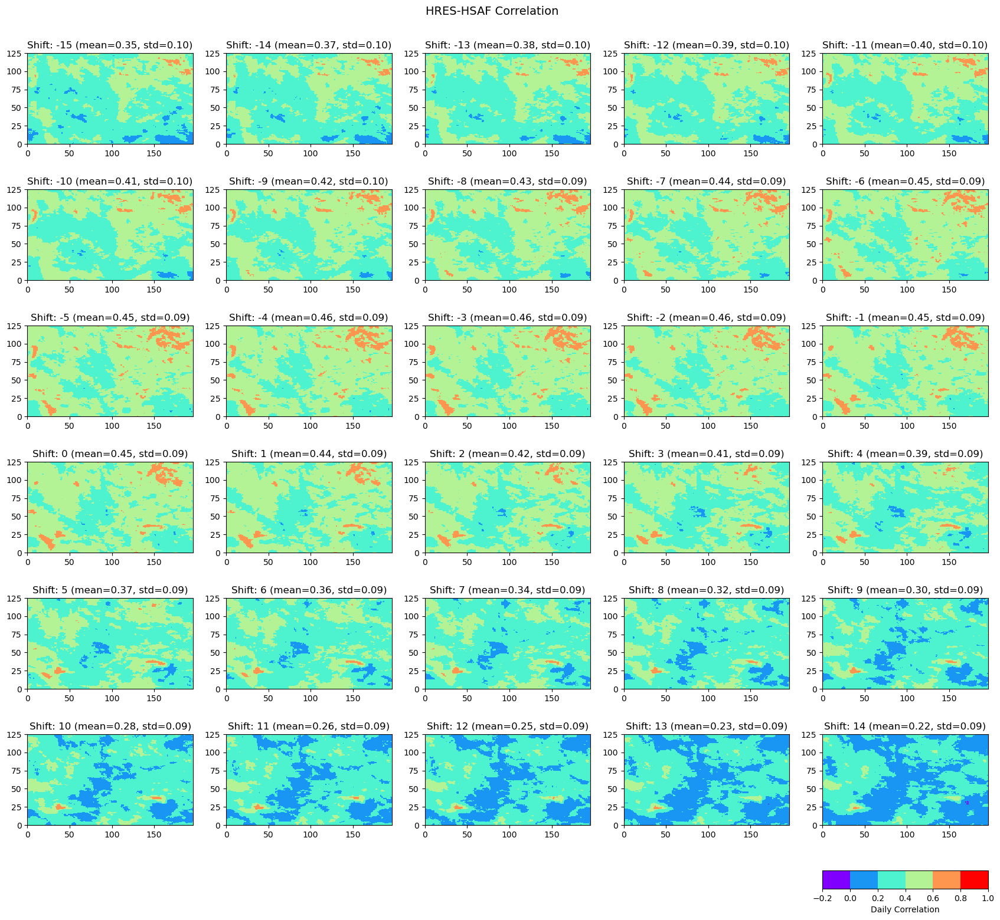

In [64]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

date_start = "2020-07-01T13"
date_end = "2021-07-01T12"

# Define the time shifts
time_shifts = range(-15, 14+1)  # -15 to +14

# Calculate the number of rows and columns for subplots
num_rows = len(time_shifts) // 5
if len(time_shifts) % 5 != 0:
    num_rows += 1
num_cols = 5

# Create the figure and subplots
fig, axes = plt.subplots(num_rows+1, num_cols, figsize=(21, 20))

# Set the main title
fig.suptitle(f"HRES-HSAF Correlation", fontsize=14, y=0.92)

# Flatten the axes for easier indexing
axes = axes.flatten()

# Loop over each time shift
for i, shift in enumerate(time_shifts):
    # Load the correlation matrix from npy file
    corr = np.load(f"{STATS}/HSAF_HRES_COR_{date_start}_{date_end}_shift={shift}.npy")
    
    # Compute average and standard deviation of the correlations
    mean_corr = np.nanmean(corr)
    std_corr = np.nanstd(corr)
    
    # Plot the correlation
    row = i // num_cols
    col = i % num_cols
    im = axes[i].pcolormesh(corr, cmap=plt.get_cmap("rainbow", 6), vmin=-0.2, vmax=1)
    axes[i].set_title(f"Shift: {shift} (mean={mean_corr:.2f}, std={std_corr:.2f})")  

# Create a divider for the colorbar
divider = make_axes_locatable(axes[-1])
cax = divider.append_axes("top", size="25%", pad=0)  # Adjust the pad value to shift the colorbar
cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
cbar.set_label('Daily Correlation')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Remove any empty subplots
if len(time_shifts) < len(axes):
    for j in range(len(time_shifts), len(axes)):
        fig.delaxes(axes[j])

#plt.tight_layout()
# Save the figure
plt.savefig(f"{DUMP_PLOT}/DAILY_HSAF_HRES_COR_{date_start}_{date_end}.png")

#### 2.2.3 Monthly

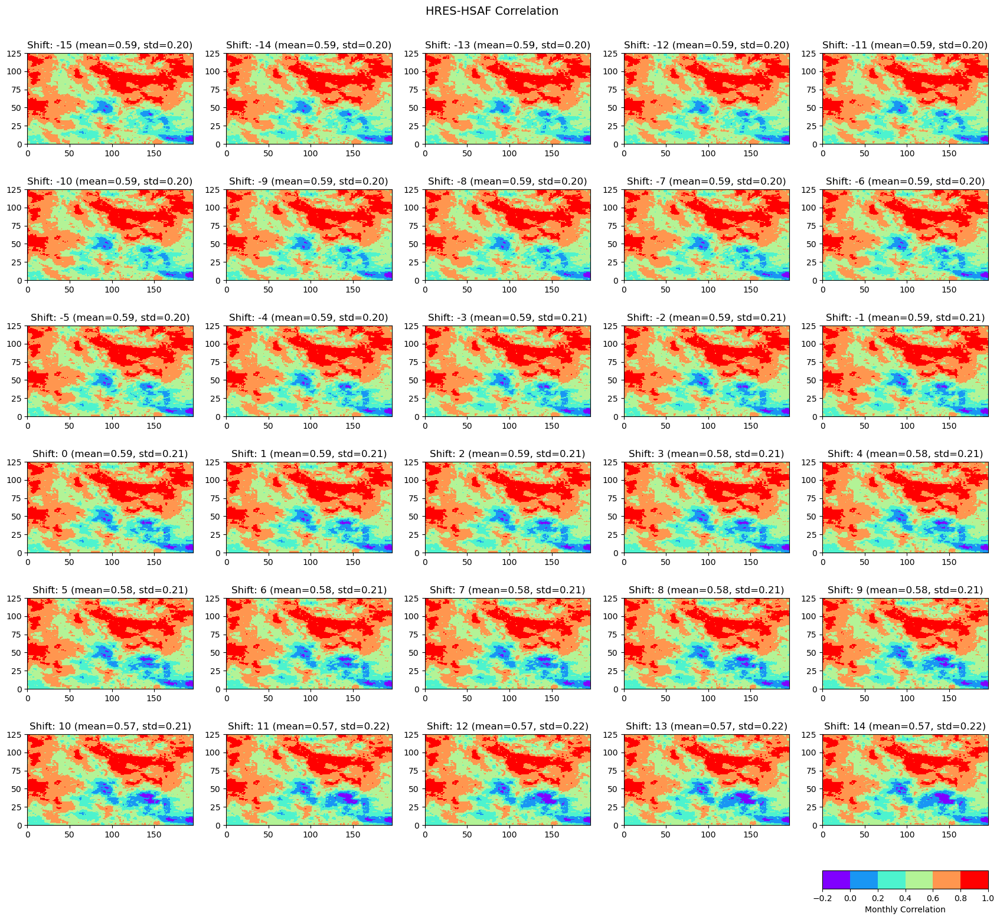

In [65]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

date_start = "2020-07-01T13"
date_end = "2021-07-01T12"

# Define the time shifts
time_shifts = range(-15, 14+1)  # -15 to +14

# Calculate the number of rows and columns for subplots
num_rows = len(time_shifts) // 5
if len(time_shifts) % 5 != 0:
    num_rows += 1
num_cols = 5

# Create the figure and subplots
fig, axes = plt.subplots(num_rows+1, num_cols, figsize=(21, 20))

# Set the main title
fig.suptitle(f"HRES-HSAF Correlation", fontsize=14, y=0.92)

# Flatten the axes for easier indexing
axes = axes.flatten()

# Loop over each time shift
for i, shift in enumerate(time_shifts):
    # Load the correlation matrix from npy file
    corr = np.load(f"{STATS}/MONTHLY_HSAF_HRES_COR_{date_start}_{date_end}_shift={shift}.npy")
    
    # Compute average and standard deviation of the correlations
    mean_corr = np.nanmean(corr)
    std_corr = np.nanstd(corr)
    
    # Plot the correlation
    row = i // num_cols
    col = i % num_cols
    im = axes[i].pcolormesh(corr, cmap=plt.get_cmap("rainbow", 6), vmin=-0.2, vmax=1)
    axes[i].set_title(f"Shift: {shift} (mean={mean_corr:.2f}, std={std_corr:.2f})")  

# Create a divider for the colorbar
divider = make_axes_locatable(axes[-1])
cax = divider.append_axes("top", size="25%", pad=0)  # Adjust the pad value to shift the colorbar
cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
cbar.set_label('Monthly Correlation')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Remove any empty subplots
if len(time_shifts) < len(axes):
    for j in range(len(time_shifts), len(axes)):
        fig.delaxes(axes[j])

#plt.tight_layout()
# Save the figure
plt.savefig(f"{DUMP_PLOT}/MONTHLY_HSAF_HRES_COR_{date_start}_{date_end}.png")

## 3. HSAF Data Availability and Quality

### 2.1. DA and DQ in Years

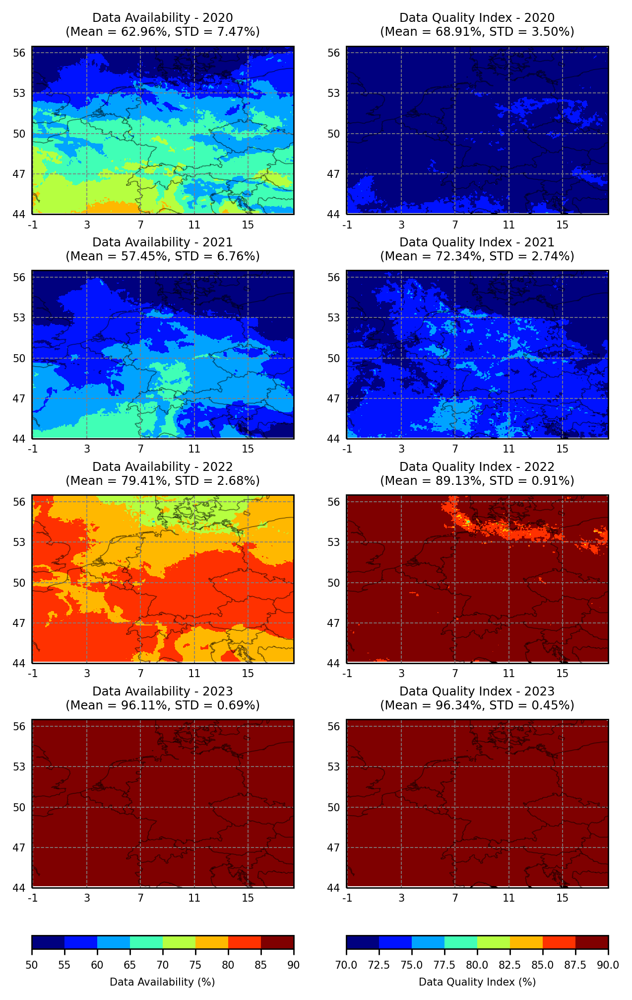

In [10]:
# Define the years
years = [2020, 2021, 2022, 2023]

# Create a figure with four subplots arranged in a 4x2 grid
fig, axs = plt.subplots(4, 2, figsize=(6, 10), facecolor="white", dpi=250, subplot_kw={'projection': ccrs.PlateCarree()})

# Iterate over the years
for i, year in enumerate(years):
    # Load data availability and data quality from NetCDF files
    data_avail = xr.open_dataset(f"{STATS}{year}_data_availability.nc")
    data_quality = xr.open_dataset(f"{STATS}{year}_data_quality.nc")

    # Plot data availability in the first column
    ax_avail = axs[i, 0]
    ax_avail.coastlines(resolution='auto', linestyle='-', alpha=0.5, linewidth=0.5)
    ax_avail.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5, linewidth=0.5)
    im_avail = ax_avail.imshow(data_avail.pr, cmap=plt.get_cmap("jet", 8), vmin=50, vmax=90,
                               origin='lower', extent=[data_avail.longitude.min(),
                                                      data_avail.longitude.max(),
                                                      data_avail.latitude.min(),
                                                      data_avail.latitude.max()])
    ax_avail.set_title(f'Data Availability - {year}\n(Mean = {np.nanmean(data_avail.pr):.2f}%, STD = {np.nanstd(data_avail.pr):.2f}%)',
                       fontsize=7)

    # Set xticks and yticks for data availability plot
    xticks_avail = np.arange(int(data_avail.longitude.min()), int(data_avail.longitude.max()) + 1, 4)
    yticks_avail = np.arange(int(data_avail.latitude.min()), int(data_avail.latitude.max()) + 1, 3)
    ax_avail.set_xticks(xticks_avail, crs=ccrs.PlateCarree())
    ax_avail.set_yticks(yticks_avail, crs=ccrs.PlateCarree())
    lon_formatter_avail = mticker.StrMethodFormatter("{x:.0f}")
    lat_formatter_avail = mticker.StrMethodFormatter("{x:.0f}")
    ax_avail.xaxis.set_major_formatter(lon_formatter_avail)
    ax_avail.yaxis.set_major_formatter(lat_formatter_avail)
    ax_avail.tick_params(axis='both', which='both', labelsize=6)
    ax_avail.gridlines(xlocs=xticks_avail, ylocs=yticks_avail, color='gray', linestyle='dashed', linewidth=0.5)
    ax_avail.xaxis.set_ticks_position('none')
    ax_avail.yaxis.set_ticks_position('none')
    ax_avail.tick_params(axis='both', which='both', length=0)

    # Plot data quality in the second column
    ax_quality = axs[i, 1]
    ax_quality.coastlines(resolution='auto', linestyle='-', alpha=0.5, linewidth=0.5)
    ax_quality.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5, linewidth=0.5)
    ax_quality.add_feature(cfeature.LAND, facecolor='w', edgecolor='k')
    im_quality = ax_quality.imshow(data_quality.qind, cmap=plt.get_cmap("jet", 8), vmin=70, vmax=90,
                                   origin='lower', extent=[data_quality.longitude.min(),
                                                          data_quality.longitude.max(),
                                                          data_quality.latitude.min(),
                                                          data_quality.latitude.max()])
    ax_quality.set_title(f'Data Quality Index - {year}\n(Mean = {np.nanmean(data_quality.qind):.2f}%, STD = {np.nanstd(data_quality.qind):.2f}%)',
                         fontsize=7)

    # Set xticks and yticks for data quality plot
    xticks_quality = np.arange(int(data_quality.longitude.min()), int(data_quality.longitude.max()) + 1, 4)
    yticks_quality = np.arange(int(data_quality.latitude.min()), int(data_quality.latitude.max()) + 1, 3)
    ax_quality.set_xticks(xticks_quality, crs=ccrs.PlateCarree())
    ax_quality.set_yticks(yticks_quality, crs=ccrs.PlateCarree())
    lon_formatter_quality = mticker.StrMethodFormatter("{x:.0f}")
    lat_formatter_quality = mticker.StrMethodFormatter("{x:.0f}")
    ax_quality.xaxis.set_major_formatter(lon_formatter_quality)
    ax_quality.yaxis.set_major_formatter(lat_formatter_quality)
    ax_quality.tick_params(axis='both', which='both', labelsize=6)
    ax_quality.gridlines(xlocs=xticks_quality, ylocs=yticks_quality, color='gray', linestyle='dashed', linewidth=0.5)
    ax_quality.xaxis.set_ticks_position('none')
    ax_quality.yaxis.set_ticks_position('none')
    ax_quality.tick_params(axis='both', which='both', length=0)

# Add colorbars
cbar_avail = fig.colorbar(im_avail, ax=axs[:, 0], orientation='horizontal', fraction=0.05, pad=0.05)
cbar_avail.set_label('Data Availability (%)', fontsize=6)
cbar_avail.ax.tick_params(labelsize=6)

cbar_quality = fig.colorbar(im_quality, ax=axs[:, 1], orientation='horizontal', fraction=0.05, pad=0.05)
cbar_quality.set_label('Data Quality Index (%)', fontsize=6)
cbar_quality.ax.tick_params(labelsize=6)

# Save the combined plot
plt.savefig(f"{DUMP_PLOT}/HSAF_DA_DQ_Years_maps.png")

# Show the plot
plt.show()

In [ ]:
### 2.2. DA and DQ in Seasons

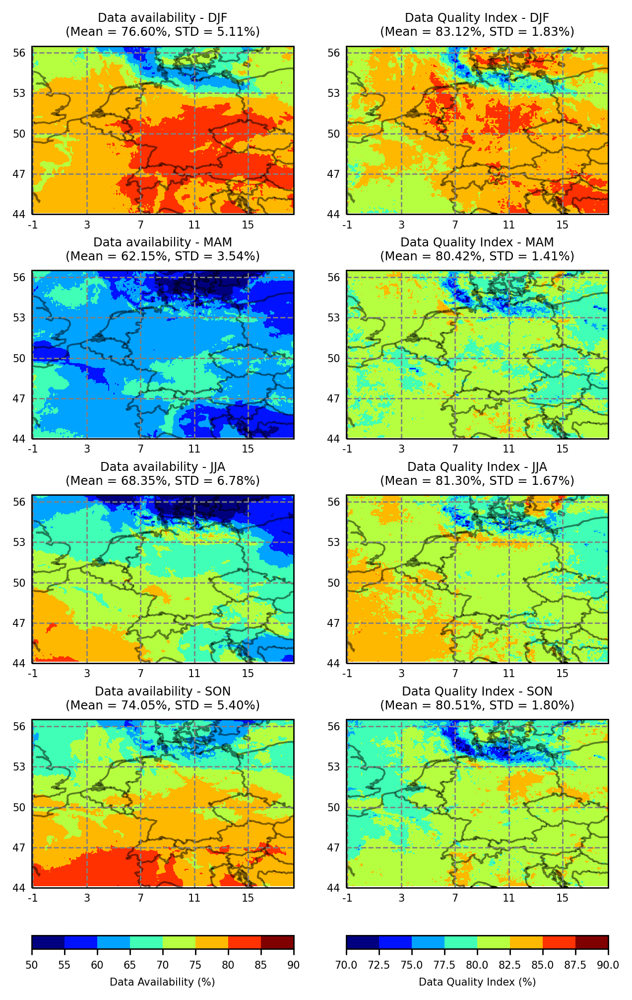

In [59]:
import xr as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker

# Define the seasons
seasons = ["DJF", "MAM", "JJA", "SON"]

# Create a figure with four subplots arranged in a 4x2 grid
fig, axs = plt.subplots(4, 2, figsize=(6, 10), facecolor="white", dpi=250, subplot_kw={'projection': ccrs.PlateCarree()})

# Iterate over the seasons
for i, season in enumerate(seasons):
    # Load data availability and data quality from NetCDF files
    data_avail = xr.open_dataset(f"{STATS}{season}_data_availability.nc")
    data_quality = xr.open_dataset(f"{STATS}{season}_data_quality.nc")

    # Plot data availability in the first column
    ax_avail = axs[i, 0]
    ax_avail.coastlines(resolution='auto', linestyle='-', alpha=0.5)
    ax_avail.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5)
    im_avail = ax_avail.imshow(data_avail.pr, cmap=plt.get_cmap("jet", 8), vmin=50, vmax=90,
                               origin='lower', extent=[data_avail.longitude.min(),
                                                      data_avail.longitude.max(),
                                                      data_avail.latitude.min(),
                                                      data_avail.latitude.max()])
    ax_avail.set_title(f'Data availability - {season}\n(Mean = {np.nanmean(data_avail.pr):.2f}%, STD = {np.nanstd(data_avail.pr):.2f}%)',
                       fontsize=7)

    # Set xticks and yticks for data availability plot
    xticks_avail = np.arange(int(data_avail.longitude.min()), int(data_avail.longitude.max()) + 1, 4)
    yticks_avail = np.arange(int(data_avail.latitude.min()), int(data_avail.latitude.max()) + 1, 3)
    ax_avail.set_xticks(xticks_avail, crs=ccrs.PlateCarree())
    ax_avail.set_yticks(yticks_avail, crs=ccrs.PlateCarree())
    lon_formatter_avail = mticker.StrMethodFormatter("{x:.0f}")
    lat_formatter_avail = mticker.StrMethodFormatter("{x:.0f}")
    ax_avail.xaxis.set_major_formatter(lon_formatter_avail)
    ax_avail.yaxis.set_major_formatter(lat_formatter_avail)
    ax_avail.tick_params(axis='both', which='both', labelsize=6)  # Updated font size for xtick and ytick labels
    ax_avail.gridlines(xlocs=xticks_avail, ylocs=yticks_avail, color='gray', linestyle='dashed')
    ax_avail.xaxis.set_ticks_position('none')
    ax_avail.yaxis.set_ticks_position('none')
    ax_avail.tick_params(axis='both', which='both', length=0)

    # Plot data quality in the second column
    ax_quality = axs[i, 1]
    ax_quality.coastlines(resolution='auto', linestyle='-', alpha=0.5)
    ax_quality.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5)
    ax_quality.add_feature(cfeature.LAND, facecolor='w', edgecolor='k')
    im_quality = ax_quality.imshow(data_quality.qind, cmap=plt.get_cmap("jet", 8), vmin=70, vmax=90,
                                   origin='lower', extent=[data_quality.longitude.min(),
                                                          data_quality.longitude.max(),
                                                          data_quality.latitude.min(),
                                                          data_quality.latitude.max()])
    ax_quality.set_title(f'Data Quality Index - {season}\n(Mean = {np.nanmean(data_quality.qind):.2f}%, STD = {np.nanstd(data_quality.qind):.2f}%)',
                         fontsize=7)

    # Set xticks and yticks for data quality plot
    xticks_quality = np.arange(int(data_quality.longitude.min()), int(data_quality.longitude.max()) + 1, 4)
    yticks_quality = np.arange(int(data_quality.latitude.min()), int(data_quality.latitude.max()) + 1, 3)
    ax_quality.set_xticks(xticks_quality, crs=ccrs.PlateCarree())
    ax_quality.set_yticks(yticks_quality, crs=ccrs.PlateCarree())
    lon_formatter_quality = mticker.StrMethodFormatter("{x:.0f}")
    lat_formatter_quality = mticker.StrMethodFormatter("{x:.0f}")
    ax_quality.xaxis.set_major_formatter(lon_formatter_quality)
    ax_quality.yaxis.set_major_formatter(lat_formatter_quality)
    ax_quality.tick_params(axis='both', which='both', labelsize=6)  # Updated font size for xtick and ytick labels
    ax_quality.gridlines(xlocs=xticks_quality, ylocs=yticks_quality, color='gray', linestyle='dashed')
    ax_quality.xaxis.set_ticks_position('none')
    ax_quality.yaxis.set_ticks_position('none')
    ax_quality.tick_params(axis='both', which='both', length=0)

# Add colorbars
cbar_avail = fig.colorbar(im_avail, ax=axs[:, 0], orientation='horizontal', fraction=0.05, pad=0.05)
cbar_avail.set_label('Data Availability (%)', fontsize=6)  # Updated font size for colorbar title
cbar_avail.ax.tick_params(labelsize=6)  # Updated font size for colorbar tick labels

cbar_quality = fig.colorbar(im_quality, ax=axs[:, 1], orientation='horizontal', fraction=0.05, pad=0.05)
cbar_quality.set_label('Data Quality Index (%)', fontsize=6)  # Updated font size for colorbar title
cbar_quality.ax.tick_params(labelsize=6)  # Updated font size for colorbar tick labels

# Save the combined plot
plt.savefig(f"{DUMP_PLOT}/HSAF_DA_DQ_Seasons.png")

### 2.3. DA in UTC Hours

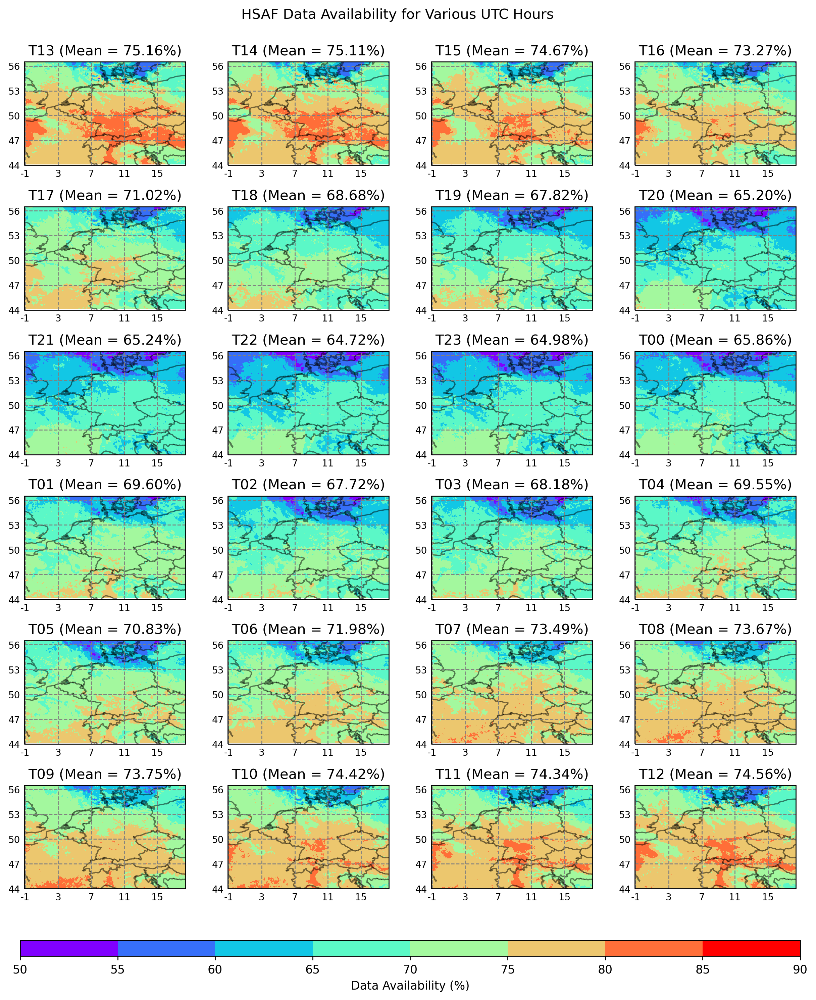

In [55]:
# Load the masks as xr datasets
mask_hourly = xr.open_dataset(f"{STATSBASIC}nona_mask_pr_hourly.nc")

# Create a figure with subplots
fig, axs = plt.subplots(6, 4, figsize=(12, 16), facecolor="white", dpi=250,
                        subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=0.4)

# List to store all the plotted images
images = []

# Iterate through UTC times
for utc_time, ax in zip(list(range(13, 24)) + list(range(0, 13)), axs.flatten()):
    #print(utc_time)
    # Select the corresponding hour from mask_hourly
    hour_mask = mask_hourly.where(mask_hourly.time.dt.hour == utc_time, drop=True)

    # Extract the variable from the dataset
    percent_available_hourly = (hour_mask.sum("time") / hour_mask.time.size) * 100

    # Calculate the mean availability for the hour
    mean_availability = np.nanmean(percent_available_hourly.pr)

    # Add coastal features, country borders, and land to the subplot
    ax.coastlines(resolution='auto', linestyle='-', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5)

    # Plot the hourly map in the subplot
    im = ax.imshow(percent_available_hourly.pr, cmap=plt.get_cmap("rainbow", 8), vmin=50, vmax=90, origin='lower',
                   extent=[percent_available_hourly.longitude.min(), percent_available_hourly.longitude.max(),
                           percent_available_hourly.latitude.min(), percent_available_hourly.latitude.max()])
    ax.set_title(f'T{utc_time:02d} (Mean = {mean_availability:.2f}%)')

    # Set xticks and yticks based on the min and max of latitude and longitude
    xticks = np.arange(int(percent_available_hourly.longitude.min()),
                       int(percent_available_hourly.longitude.max()) + 1, 4)
    yticks = np.arange(int(percent_available_hourly.latitude.min()),
                       int(percent_available_hourly.latitude.max()) + 1, 3)
    ax.set_xticks(xticks, crs=ccrs.PlateCarree())
    ax.set_yticks(yticks, crs=ccrs.PlateCarree())

    # Set the tick labels using the desired format and reduced font size
    lon_formatter = mticker.StrMethodFormatter("{x:.0f}")
    lat_formatter = mticker.StrMethodFormatter("{x:.0f}")
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.tick_params(axis='both', which='both', labelsize=8)

    # Draw gridlines only on labeled ticks
    ax.gridlines(xlocs=xticks, ylocs=yticks, color='gray', linestyle='dashed')
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.tick_params(axis='both', which='both', length=0)

    # Append the plotted image to the list
    images.append(im)

# Create a single colorbar for all the subplots
colorbar = fig.colorbar(images[0], ax=axs, orientation='horizontal', pad=0.05, aspect=50)
colorbar.set_label('Data Availability (%)')

# Hide empty subplots
for i in range(len(axs.flatten()), len(axs.flat), -1):
    fig.delaxes(axs.flatten()[i - 1])

# Add a title to the figure
fig.suptitle('HSAF Data Availability in UTC Hours', y=0.92)

# Save the figure
plt.savefig(f"{DUMP_PLOT}/HSAF_DA_UTC_hour.png")

plt.show()

### 2.4. DQ in UTC Hours

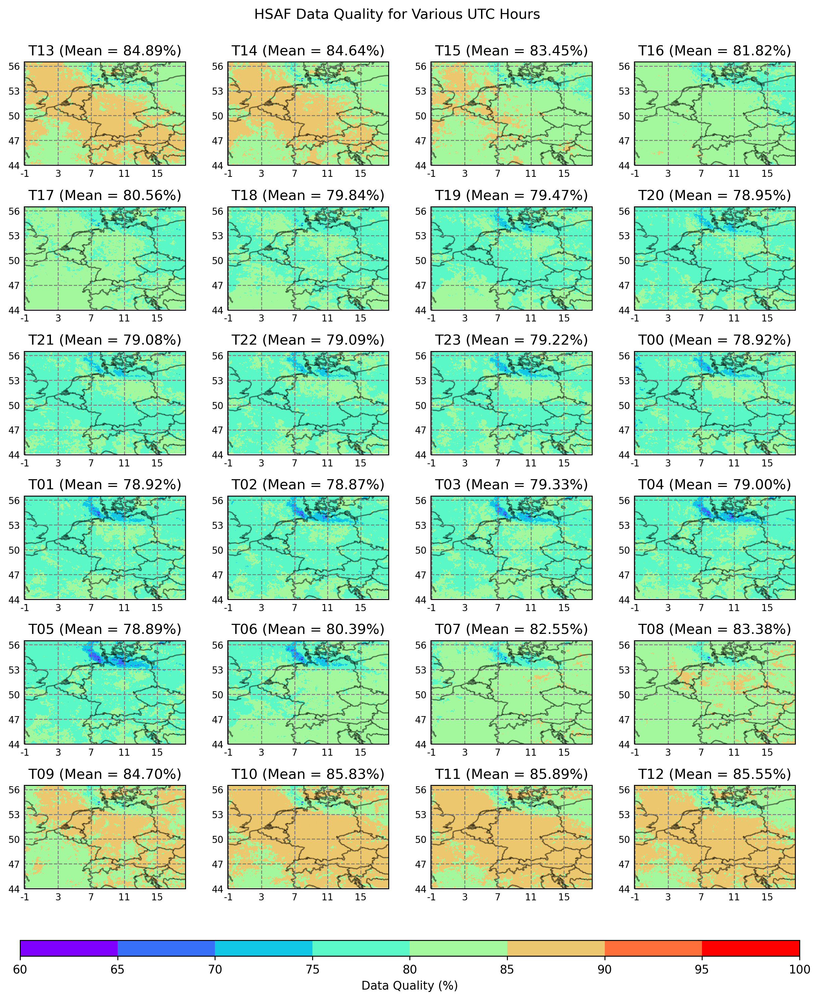

In [57]:
# Load the HSAF dataset
hsaf_directory = ATMOS_DATA + "/HSAF_pr.nc"
HSAF = xr.open_dataset(hsaf_directory)
qind = HSAF["qind"]

# Create a figure with subplots
fig, axs = plt.subplots(6, 4, figsize=(12, 16), facecolor="white", dpi=250,
                        subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=0.4)

# List to store all the plotted images
images = []

# Iterate through UTC times
for utc_time, ax in zip(list(range(13, 24)) + list(range(0, 13)), axs.flatten()):
    #print(utc_time)
    # Select the corresponding hour
    hour_qind = qind.where(qind.time.dt.hour == utc_time, drop=True)

    # calculate the mean
    avg_qind = hour_qind.mean(dim="time", skipna=True)

    # Calculate the mean availability for the hour
    mean_hour_qind = np.nanmean(hour_qind)

    # Add coastal features, country borders, and land to the subplot
    ax.coastlines(resolution='auto', linestyle='-', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5)

    # Plot the hourly map in the subplot
    im = ax.imshow(avg_qind, cmap=plt.get_cmap("rainbow", 8), vmin=60, vmax=100, origin='lower',
                   extent=[avg_qind.longitude.min(), avg_qind.longitude.max(),
                           avg_qind.latitude.min(), avg_qind.latitude.max()])
    ax.set_title(f'T{utc_time:02d} (Mean = {mean_hour_qind:.2f}%)')

    # Set xticks and yticks based on the min and max of latitude and longitude
    xticks = np.arange(int(avg_qind.longitude.min()), int(avg_qind.longitude.max()) + 1, 4)
    yticks = np.arange(int(avg_qind.latitude.min()), int(avg_qind.latitude.max()) + 1, 3)
    ax.set_xticks(xticks, crs=ccrs.PlateCarree())
    ax.set_yticks(yticks, crs=ccrs.PlateCarree())

    # Set the tick labels using the desired format and reduced font size
    lon_formatter = mticker.StrMethodFormatter("{x:.0f}")
    lat_formatter = mticker.StrMethodFormatter("{x:.0f}")
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.tick_params(axis='both', which='both', labelsize=8)

    # Draw gridlines only on labeled ticks
    ax.gridlines(xlocs=xticks, ylocs=yticks, color='gray', linestyle='dashed')
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.tick_params(axis='both', which='both', length=0)

    # Append the plotted image to the list
    images.append(im)

# Create a single colorbar for all the subplots
colorbar = fig.colorbar(images[0], ax=axs, orientation='horizontal', pad=0.05, aspect=50)
colorbar.set_label('Data Quality (%)')

# Hide empty subplots
for i in range(len(axs.flatten()), len(axs.flat), -1):
    fig.delaxes(axs.flatten()[i - 1])

# Add a title to the figure
fig.suptitle('HSAF Data Quality for Various UTC Hours', y=0.92)

# Save the figure
plt.savefig(f"{DUMP_PLOT}/HSAF_DQ_UTC_hour.png")

### 2.5. DA and DQ Average

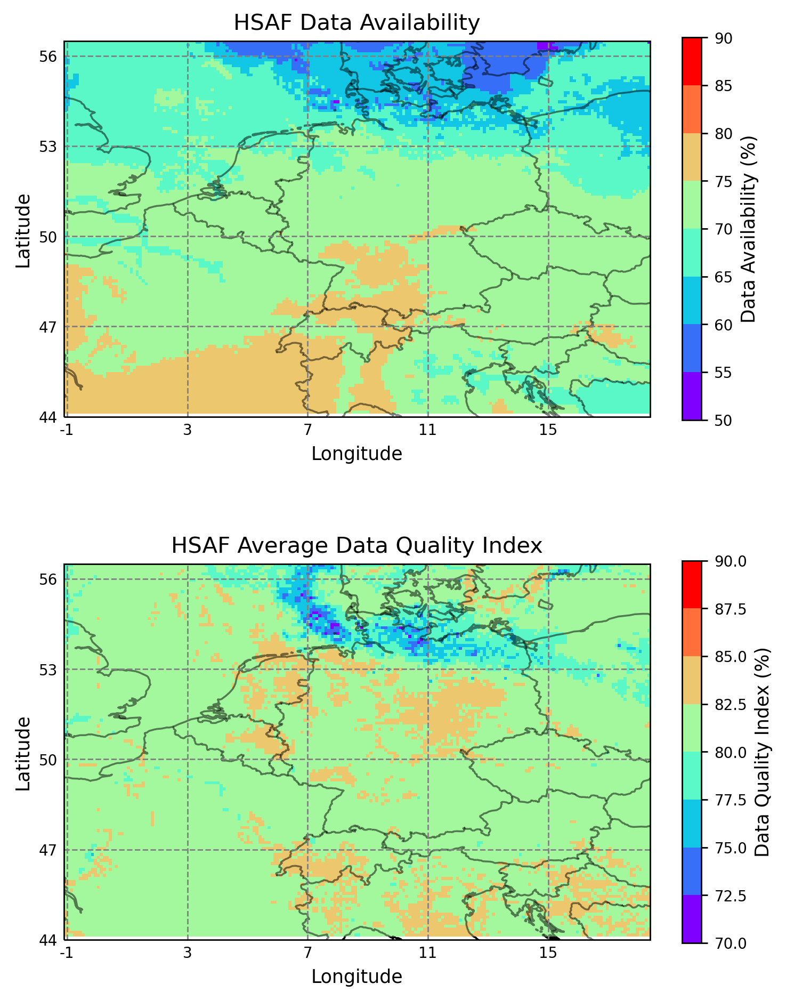

In [67]:
import xr as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker

# Load the masks as xr datasets
mask_hourly = xr.open_dataset(f"{STATSBASIC}nona_mask_pr_hourly.nc")

# Extract the variable from the dataset
percent_available_hourly = (mask_hourly.sum("time") / mask_hourly.time.size) * 100

# Load the NetCDF file
file_path = ATMOS_DATA+"/HSAF_pr.nc"
data = xr.open_dataset(file_path)

# Extract the qind variable
qind = data["qind"]

# Calculate the average of qind along the time dimension
avg_qind = qind.mean(dim="time", skipna=True)

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8), facecolor="white", dpi=250, subplot_kw={'projection': ccrs.PlateCarree()})

# Add coastal features, country borders, and land to the first subplot
ax1.coastlines(resolution='auto', linestyle='-', alpha=0.5)  # Increase border line detail
ax1.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5)  # Increase country border line detail

# Plot the hourly map in the first subplot
im1 = ax1.imshow(percent_available_hourly.pr, cmap=plt.get_cmap("rainbow", 8), vmin=50, vmax=90, origin='lower',
               extent=[percent_available_hourly.longitude.min(), percent_available_hourly.longitude.max(),
                       percent_available_hourly.latitude.min(), percent_available_hourly.latitude.max()])
ax1.set_title('HSAF Data Availability')

# Set xticks and yticks based on the min and max of latitude and longitude
xticks1 = np.arange(int(percent_available_hourly.longitude.min()), int(percent_available_hourly.longitude.max()) + 1, 4)
yticks1 = np.arange(int(percent_available_hourly.latitude.min()), int(percent_available_hourly.latitude.max()) + 1, 3)
ax1.set_xticks(xticks1, crs=ccrs.PlateCarree())
ax1.set_yticks(yticks1, crs=ccrs.PlateCarree())

# Set the tick labels using the desired format and reduced font size
lon_formatter1 = mticker.StrMethodFormatter("{x:.0f}")
lat_formatter1 = mticker.StrMethodFormatter("{x:.0f}")
ax1.xaxis.set_major_formatter(lon_formatter1)
ax1.yaxis.set_major_formatter(lat_formatter1)
ax1.tick_params(axis='both', which='both', labelsize=8)  # Reduce tick label font size

# Draw gridlines only on labeled ticks
ax1.gridlines(xlocs=xticks1, ylocs=yticks1, color='gray', linestyle='dashed')
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_ticks_position('none')
ax1.tick_params(axis='both', which='both', length=0)

ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')

# Add a colorbar on the right side for the first subplot with reduced font size
cbar1 = fig.colorbar(im1, ax=ax1, orientation='vertical', pad=0.05, fraction=0.03)
cbar1.ax.tick_params(labelsize=8)  # Reduce colorbar font size
cbar1.set_label('Data Availability (%)')

# Add coastal features, country borders, and land to the second subplot
ax2.coastlines(resolution='auto', linestyle='-', alpha=0.5)  # Increase border line detail
ax2.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5)  # Increase country border line detail
ax2.add_feature(cfeature.LAND, facecolor='w', edgecolor='k')

# Plot the average qind as a 2D map in the second subplot
im2 = ax2.imshow(avg_qind, cmap=plt.get_cmap("rainbow", 8), vmin=70, vmax=90, origin='lower',
               extent=[avg_qind.longitude.min(), avg_qind.longitude.max(), avg_qind.latitude.min(), avg_qind.latitude.max()])
ax2.set_title('HSAF Average Data Quality Index')

# Set xticks and yticks based on the latitude and longitude range
xticks2 = np.arange(int(avg_qind.longitude.min()), int(avg_qind.longitude.max()) + 1, 4)
yticks2 = np.arange(int(avg_qind.latitude.min()), int(avg_qind.latitude.max()) + 1, 3)
ax2.set_xticks(xticks2, crs=ccrs.PlateCarree())
ax2.set_yticks(yticks2, crs=ccrs.PlateCarree())

# Set the tick labels using the desired format and reduced font size
lon_formatter2 = mticker.StrMethodFormatter("{x:.0f}")
lat_formatter2 = mticker.StrMethodFormatter("{x:.0f}")
ax2.xaxis.set_major_formatter(lon_formatter2)
ax2.yaxis.set_major_formatter(lat_formatter2)
ax2.tick_params(axis='both', which='both', labelsize=8)  # Reduce tick label font size

# Draw gridlines only on labeled ticks
ax2.gridlines(xlocs=xticks2, ylocs=yticks2, color='gray', linestyle='dashed')
ax2.xaxis.set_ticks_position('none')
ax2.yaxis.set_ticks_position('none')
ax2.tick_params(axis='both', which='both', length=0)

ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')

# Add a colorbar on the right side for the second subplot with reduced font size
cbar2 = fig.colorbar(im2, ax=ax2, orientation='vertical', pad=0.05, fraction=0.03)
cbar2.ax.tick_params(labelsize=8)  # Reduce colorbar font size
cbar2.set_label('Data Quality Index (%)')

# Adjust the layout
plt.tight_layout()

# Save the combined plot
plt.savefig(f"{DUMP_PLOT}/HSAF_DA_DQ_ALL.png")

In [ ]:
### 1.1. Precipitation 